# Projet 3 - Concevez une application au service de la santé publique - Part 2

## Table des matières

### 1. [Les Imports](#Section1)
- 1.1 [Les libraries](#1.1-Les-libraries)
- 1.2 [Les paramètres de sortie](#1.2-Les-paramètres-de-sortie)
- 1.3 [Les données](#1.3-Les-données)

### 2. [Les Fonctions](#Section2)

### 3. [Les Analyses Univariées](#Section3)
- 3.1 [Les Catégories d'Alimentation](#3.1-Les-Catégories-d'Alimentation-(prédéfinies))
- 3.2 [Les Informations Nutritionelles](#3.2-Les-Informations-Nutritionelles)
- 3.3 [Le Nutri-Score](#3.3-Le-Nutri-Score)

### 4. [Analyses multivariées](#Section4)
- 4.1 [Les Informations Nutritionelles](#4.1-Les-Informations-Nutritionelles)
- 4.2 [Les Informations Nutritionnelles et les Catégories d'Alimentation](#4.2-Les-Informations-Nutritionnelles-et-les-Catégories-d'Alimentation)
- 4.3 [PCA](#4.3-PCA)
- 4.4 [K-Means Clustering](#4.4-K-Means-Clustering)

<a id="Section1"></a>
## 1. Les Imports et paramètres de sortie

### 1.1 Les libraries

In [1]:
#imports: regular expresssions, operating system, math operations
#import re,os,math
import os, random

#data modules
import numpy as np
import pandas as pd
import scipy as sp

#graphic modules
import matplotlib.pyplot as plt
import seaborn as sns

# Import the sklearn function
from sklearn.preprocessing import StandardScaler
# Import the kmeans algorithm
from sklearn.cluster import KMeans
# Import the PCA function from sklearn
from sklearn.decomposition import PCA

In [2]:
sns.set() #sets the theme of seaborn
#creates static png images of the plots within the notebook (other option: 'notebook' for interactive plots)
%matplotlib inline 

### 1.2 Les paramètres de sortie
Ici, on peut choisir, si on veut voir les détails et sauvegarder les images, la data, etc.

In [3]:
print_details = True
save_figures = True
save_data = False
do_long_computations = False

### 1.3 Les données

In [4]:
PATH_TO_DATA = os.getcwd() + '\\Data\\'

food_groups_df = pd.DataFrame()
food_info_df =  pd.DataFrame()
nutritional_values_df = pd.DataFrame()
ecoscore_df = pd.DataFrame()
nutriscore_df = pd.DataFrame()

data_dict = {'food_groups' : food_groups_df, 'food_info' : food_info_df,
             'nutritional_values' : nutritional_values_df, 'ecoscore' : ecoscore_df, 'nutriscore' : nutriscore_df}

def rename_index_column(df):
    df.columns = ['id_index'] + list(df.columns[1:])
    df.set_index('id_index', inplace = True)

for name, df in data_dict.items() :
    df = pd.read_csv(PATH_TO_DATA +'openfoodfacts_' + name, sep = ',')
    data_dict[name] = df
    rename_index_column(data_dict[name])

In [5]:
#check that all went well
for name, df in data_dict.items() :
    print(name)
    print(50*'-')
    print(df.describe())
    print(50*'-')
    print(df.sample(5))
    print(50*'_')
    print()

food_groups
--------------------------------------------------
       pnns_groups_1 pnns_groups_2 nova_group
count        1907318       1907318    1907318
unique            11            40          5
top          unknown       unknown    unknown
freq         1174482       1174480    1288719
--------------------------------------------------
          pnns_groups_1       pnns_groups_2 nova_group
id_index                                              
180306    Sugary snacks              Sweets    unknown
1754486    Salty snacks                Nuts    unknown
1050584   Sugary snacks  Biscuits and cakes    unknown
662806          unknown             unknown    unknown
1004534         unknown             unknown    unknown
__________________________________________________

food_info
--------------------------------------------------
               code                  product_name  \
count       1907318                       1827702   
unique      1906394                       1192378   

In [6]:
food_info_df = data_dict['food_info']
food_groups_df = data_dict['food_groups']
nutritional_values_df = data_dict['nutritional_values']
nutriscore_df = data_dict['nutriscore']
ecoscore_df = data_dict['ecoscore']

<a id="Section2"></a>
## 2. Les fonctions

In [7]:
def plot_pie_value_counts(series, labels=[], name = '', savefigure = False, title = '',**kwargs):
    '''Plots a pie chart of the value_counts of a series, with the defined labels and the order they are listed in.'''   
    
    value_counts_series = series.value_counts(sort=False)
    value_counts = pd.Series(dtype = 'int64')
    
    if len(labels):
        plot_labels = labels.copy()
        for l in labels :
            if l in value_counts_series.index.values :
                value_counts[l] = value_counts_series[l]
            else :
                plot_labels.remove(l)
        
    else :
        value_counts = value_counts_series
        plot_labels = value_counts.index.values


    fig1, ax1 = plt.subplots()
    ax1.pie(value_counts, labels=plot_labels, **kwargs)
    ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    ax1.set_title(title)
    if savefigure :
        plt.savefig(os.getcwd() + '\\Figures\\' + name +'_PieChart', dpi = 200)
    plt.show()

In [8]:
def plot_box_and_violin(df, columns, figsize = None, ylabel = None, name = '', savefigure = False, title = '') :
    fig, ax = plt.subplots(figsize=figsize)
    plt.boxplot(df[columns], showmeans = True, showfliers = False)
    plt.violinplot(df[columns], showextrema = False)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    plt.setp(ax, xticks=[y + 1 for y in range(len(columns))], xticklabels=columns)
    if savefigure :
        plt.savefig(os.getcwd() + '\\Figures\\' + name +'_BoxViolin', dpi = 200)
    plt.show()

In [9]:
def display_scree_plot(pca, name='',savefigure = False):
    '''Display a scree plot for the pca'''

    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("Rang de l'axe d'inertie")
    plt.ylabel("Pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    #plt.title("Scree plot")
    if savefigure :
        plt.savefig(os.getcwd() + '\\Figures\\' + name +'_ScreePlot', dpi = 200)
    plt.show(block=False)

In [10]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    """Display correlation circles, one for each factorial plane"""

    # For each factorial plane
    for d1, d2 in axis_ranks: 
        if d2 < n_comp:

            # Initialise the matplotlib figure
            fig, ax = plt.subplots(figsize=(10,10))

            # Determine the limits of the chart
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # Add arrows
            # If there are more than 30 arrows, we do not display the triangle at the end
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (see the doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # Display variable names
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', 
                                 rotation=label_rotation, color="blue", alpha=0.5)
            
            # Display circle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # Define the limits of the chart
            #plt.xlim(xmin, xmax)
            #plt.ylim(ymin, ymax)
        
            # Display grid lines
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('PC{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Correlation Circle (PC{} and PC{})".format(d1+1, d2+1))
            plt.show(block=False)

In [11]:
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, marker = '.', illustrative_var=None):
    '''Display a scatter plot on a factorial plane, one for each factorial plane'''

    # For each factorial plane
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # Initialise the matplotlib figure      
            fig = plt.figure(figsize=(7,6))
        
            # Display the points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha, marker = marker)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, marker = marker,label=value)
                plt.legend()

            # Display the labels on the points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # Define the limits of the chart
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # Display grid lines
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('PC{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection of points (on PC{} and PC{})".format(d1+1, d2+1))
            #plt.show(block=False)

In [12]:
from pandas.plotting import parallel_coordinates
palette = sns.color_palette("bright", 10)

def display_parallel_coordinates_centroids(df, num_clusters, figsize = None, ylabel = None):
    '''Display a parallel coordinates plot for the centroids in df'''

    # Create the plot
    fig = plt.figure(figsize=figsize)
    title = fig.suptitle("Tracé des Centroïdes", fontsize=18)
    fig.subplots_adjust(top=0.9, wspace=0)

    # Draw the chart
    parallel_coordinates(df, 'cluster', color=palette)
    
    # Stagger the axes
    ax=plt.gca()
    ax.set_ylabel(ylabel)
    for tick in ax.xaxis.get_major_ticks()[1::2]:
        tick.set_pad(20)    

In [13]:
def plot_feature_density_for_groups(df, features, group_column, group_values = [], xlim=None, xlabel = None, figsize = None,
                                   name = '', savefigure = False) :
    X = df[features].copy()
    X["group"] = df[group_column].copy()
    groups = group_values if len(group_values) else X.group.unique()
        
    for col in features :
        fig, ax = plt.subplots(figsize = figsize)
        for cat in groups :
            sns.kdeplot(X.loc[X.group == cat, col], shade=False, label=cat)
        plt.xlabel(xlabel)
        ax.set_xlim(xlim)
        plt.title(col)
        plt.legend()
        if savefigure :
            plt.savefig(os.getcwd() + '\\Figures\\' + name +'_'+col+'_Density', dpi = 200)

In [14]:
def plot_hist_of_groups(df, hist_group, main_group, sub_group = None, 
                        main_group_values = None, sub_group_values = None, sub_group_colors = None, figsize = None,
                        printdetails = False, savefigure = False) :
    main_group_values = main_group_values if main_group_values else df[main_group].unique()
    for mg in main_group_values:
        df_mg = df[df[main_group] == mg].copy()
        if printdetails :
            print(mg)
            print(df_mg[hist_group].sort_values().value_counts(sort = False, normalize = True))
        
        fig, ax = plt.subplots(figsize = figsize)
        if sub_group:
            sub_group_values = sub_group_values if sub_group_values else df_mg[sub_group].unique()
            for i, sg in enumerate(sub_group_values) :
                ax = df_mg[df_mg[sub_group] == sg][hist_group].hist(
                    bins = [r-0.5 for r in range(len(X[hist_group].unique())+1)],
                    label = sg, color = sub_group_colors[i%len(sub_group_colors)])
                handles, labels = ax.get_legend_handles_labels()
                ax.legend(handles, labels)
        else :
            ax = df_mg[hist_group].hist(bins = [r-0.5 for r in range(len(X[hist_group].unique())+1)])
        if savefigure:
            plt.savefig(os.getcwd() + '\\Figures\\' + mg + '_' + hist_group + '_Hist', dpi = 200)
        plt.show()

In [15]:
def eta_squared(x,y):
    mean_y = y.mean()
    categories = []
    for category in x.unique():
        yi_category = y[x==category]
        categories.append({'ni': len(yi_category),
                        'mean_category': yi_category.mean()})
    #total variation (Total Sum of Squares)
    TSS = sum([(yj-mean_y)**2 for yj in y])
    #inter- (or between) class (or category) variation
    ESS = sum([c['ni']*(c['mean_category']-mean_y)**2 for c in categories])
    return ESS/TSS

In [16]:
from wordcloud import WordCloud

def make_word_cloud(data, clustername, cluster, subplotax, title):
    words = data[data[clustername]==cluster]["product"].apply(lambda l: l.lower().split())
    cluster_words=words.apply(pd.Series).stack().reset_index(drop=True)
    frequencies = cluster_words.value_counts()
    
    text = " ".join(w for w in cluster_words)

    # Create and generate a word cloud image:
    wordcloud = WordCloud(max_font_size=40, max_words=30,
                          background_color="white", colormap="magma")
    wordcloud.generate_from_frequencies(frequencies)
    # Display the generated image:
    subplotax.imshow(wordcloud, interpolation='bilinear')
    subplotax.axis("off")
    subplotax.set_title(title)
    return subplotax

In [17]:
def plot_box_and_violin_by_cluster(df, clusterseries, figsize = None, ylabel = None, name = '', savefigure = False) :
    fig, ax = plt.subplots(figsize=figsize)
    columns = df.columns.values
    for i, c in enumerate(columns) :
        plt.boxplot(df[clusterseries == i][c], positions = [i+1], showmeans = True, showfliers = False)
        plt.violinplot(df[clusterseries == i][c], positions = [i+1], showextrema = False)
    ax.set_ylabel(ylabel)
    plt.setp(ax, xticks=[y + 1 for y in range(len(columns))], xticklabels=columns)
    if savefigure :
        plt.savefig(os.getcwd() + '\\Figures\\' + name +'_BoxViolin_byCluster', dpi = 200)
    plt.show()

<a id="Section3"></a>
## 3. Les Analyses Univariées

### 3.1 Les Catégories d'Alimentation (prédéfinies)
Les catégories sont des variables qualitatives nominales. On peut les analyser en regardant la distribution entre les différents catégories.

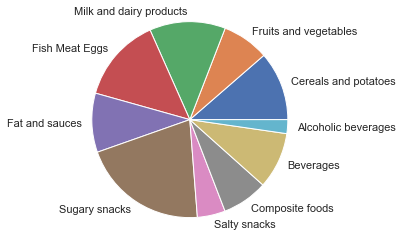

In [18]:
pnns_groups_1_values = ['Cereals and potatoes', 'Fruits and vegetables',
                        'Milk and dairy products', 'Fish Meat Eggs','Fat and sauces',
                        'Sugary snacks', 'Salty snacks','Composite foods', 
                        'Beverages', 'Alcoholic beverages']

plot_pie_value_counts(food_groups_df.pnns_groups_1, pnns_groups_1_values, name='pnns_groups_1', savefigure = save_figures)

In [19]:
pnns_groups_2_values = ['Bread', 'Cereals', 'Breakfast cereals', 'Potatoes', 'Legumes',
                        'Fruits', 'Dried fruits', 'Vegetables', 'Soups', 
                        'Milk and yogurt', 'Cheese', 'Dairy desserts', 'Ice cream', 
                        'Meat', 'Offals', 'Processed meat', 'Fish and seafood', 'Eggs',
                        'Dressings and sauces', 'Fats',
                        'Pastries', 'Biscuits and cakes', 'Sweets', 'Chocolate products',
                        'Appetizers', 'Nuts', 'Salty and fatty products',
                        'One-dish meals', 'Sandwiches', 'Pizza pies and quiches',
                        'Sweetened beverages', 'Unsweetened beverages', 'Artificially sweetened beverages',
                        'Plant-based milk substitutes', 'Fruit juices', 'Fruit nectars',
                        'Waters and flavored waters', 'Teas and herbal teas and coffees',
                        'Alcoholic beverages']

In [20]:
#plot_pie_value_counts(food_groups_df[food_groups_df.id_index.isin(nutritional_values_df.id_index)].pnns_groups_1, group_values)

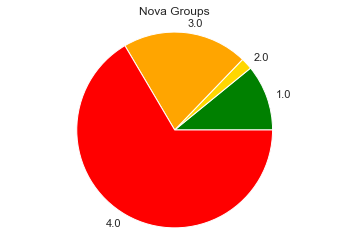

In [21]:
nova_group_values = ['1.0','2.0','3.0','4.0']
nova_group_colors = ['green', 'gold','orange', 'red', 'grey']

plot_pie_value_counts(food_groups_df.nova_group, nova_group_values, name='nova_group', savefigure = save_figures, 
                      colors = nova_group_colors, title = 'Nova Groups')

### 3.2 Les Informations Nutritionelles
Ce sont les valeus quantitatives. On peut les analyses en faisant des analyses statistiques (médian, moyenne, écart type, ...)

In [22]:
nutritional_values_df["otherfat_100g"] = nutritional_values_df.fat_100g - nutritional_values_df.saturated_fat_100g

In [23]:
nutritional_values_df.columns

Index(['energy_100g', 'energy_kcal_100g', 'fat_100g', 'saturated_fat_100g',
       'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'g_sum', 'others_100g', 'othercarbs_100g',
       'energy_min_computed', 'energy_max_computed', 'energy_others_max',
       'energy_others_min', 'otherfat_100g'],
      dtype='object')

In [24]:
nutritional_composition = ['fat_100g', 'saturated_fat_100g', 'otherfat_100g',
                           'carbohydrates_100g', 'sugars_100g', 'othercarbs_100g',
                           'proteins_100g', 'others_100g', 'salt_100g']
nutritional_energy = ['energy_100g', 'energy_min_computed', 'energy_max_computed']

nutritional_basic_elements = ['fat_100g','carbohydrates_100g', 'proteins_100g', 'others_100g']
nutritional_elements = ['saturated_fat_100g', 'otherfat_100g',
                        'sugars_100g', 'othercarbs_100g',
                        'proteins_100g', 'others_100g', 'salt_100g']

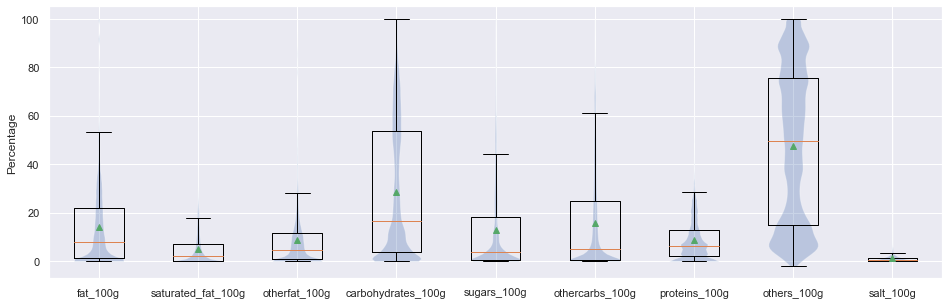

In [25]:
plot_box_and_violin(nutritional_values_df, nutritional_composition, 
                    ylabel = 'Percentage', figsize = (16,5), name = 'nutritional_composition', savefigure = save_figures )

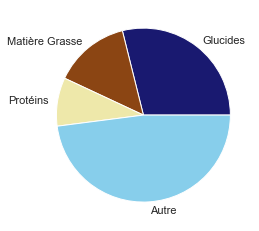

In [26]:
select = food_groups_df[(food_groups_df.pnns_groups_1 != 'Beverages') &
                        (food_groups_df.pnns_groups_1 != 'Alcoholic beverages') &
                        (food_groups_df.pnns_groups_1 != 'unknown')].index
select = food_groups_df.index


slices = [nutritional_values_df.loc[nutritional_values_df.index.isin(select)].carbohydrates_100g.mean(), 
          nutritional_values_df.loc[nutritional_values_df.index.isin(select)].fat_100g.mean(),
          nutritional_values_df.loc[nutritional_values_df.index.isin(select)].proteins_100g.mean(),
          nutritional_values_df.loc[nutritional_values_df.index.isin(select)].others_100g.mean()]
labels = ['Glucides','Matière Grasse','Protéins', 'Autre']
plt.pie(slices, labels = labels, colors = ['midnightblue', 'saddlebrown', 'palegoldenrod', 'skyblue'])
if save_figures:
    plt.savefig(os.getcwd() + '\\Figures\\' + name +'_PieChart_MeanComposition', dpi = 200)

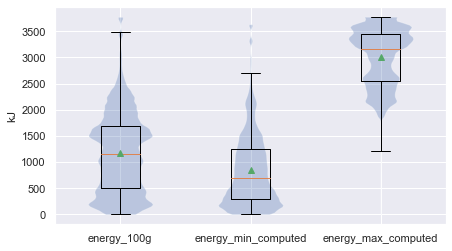

In [27]:
plot_box_and_violin(nutritional_values_df, nutritional_energy, 
                    ylabel = 'kJ', figsize = (7,4), name = 'energies', savefigure = save_figures)

### 3.3 Le Nutri-Score
Ces variables sont des variables quantitatives et qualitatives ordonnées.

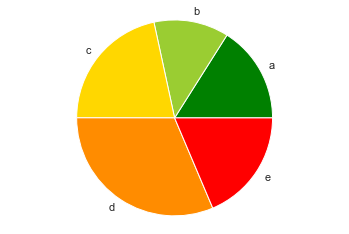

In [28]:
group_values = ['a','b','c','d','e']
nutri_score_colors = ['green','yellowgreen','gold','darkorange','red']

plot_pie_value_counts(nutriscore_df.nutriscore_grade, group_values, name = 'nutriscore_grade', savefigure = save_figures,
                     colors = nutri_score_colors)

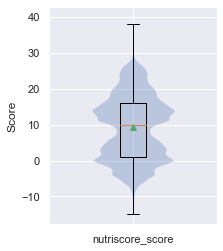

In [29]:
plot_box_and_violin(nutriscore_df, ['nutriscore_score'], 
                    ylabel = 'Score', figsize = (3,4), name = 'nutriscore_score', savefigure = save_figures)

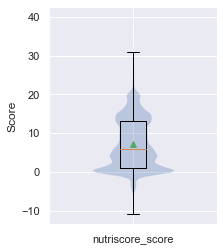

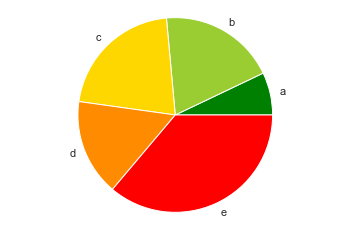

In [30]:
plot_box_and_violin(nutriscore_df[nutriscore_df.index.isin(
                                  food_groups_df[(food_groups_df.pnns_groups_1 == 'Beverages') |
                                                 (food_groups_df.pnns_groups_1 == 'Alcoholic beverages')
                                                 ].index.values)], 
                    ['nutriscore_score'], 
                    ylabel = 'Score', figsize = (3,4), name = 'nutriscore_score_boisson', savefigure = save_figures)

group_values = ['a','b','c','d','e']
plot_pie_value_counts(nutriscore_df[nutriscore_df.index.isin(
                                    food_groups_df[(food_groups_df.pnns_groups_1 == 'Beverages') |
                                                   (food_groups_df.pnns_groups_1 == 'Alcoholic beverages')
                                                   ].index.values)].nutriscore_grade, 
                     group_values, name = 'nutriscore_grade_boissons', savefigure = save_figures,
                     colors = nutri_score_colors)

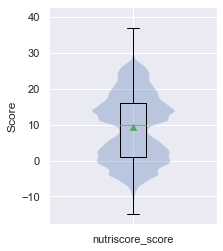

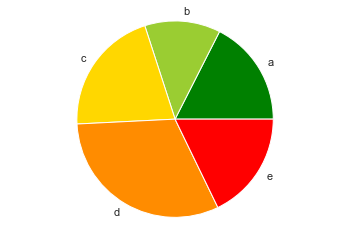

In [31]:
plot_box_and_violin(nutriscore_df[nutriscore_df.index.isin(
                                  food_groups_df[(food_groups_df.pnns_groups_1 != 'Beverages') &
                                                 (food_groups_df.pnns_groups_1 != 'unknown') &
                                                 (food_groups_df.pnns_groups_1 != 'Alcoholic beverages')
                                                 ].index.values)], 
                    ['nutriscore_score'], 
                    ylabel = 'Score', figsize = (3,4), name = 'nutriscore_score_notboisson', savefigure = save_figures)

group_values = ['a','b','c','d','e']
plot_pie_value_counts(nutriscore_df[nutriscore_df.index.isin(
                                    food_groups_df[(food_groups_df.pnns_groups_1 != 'Beverages') & 
                                                   (food_groups_df.pnns_groups_1 != 'unknown') &
                                                   (food_groups_df.pnns_groups_1 != 'Alcoholic beverages')
                                                   ].index.values)].nutriscore_grade, 
                     group_values, name = 'nutriscore_grade_notboissons', savefigure = save_figures,
                     colors = nutri_score_colors)

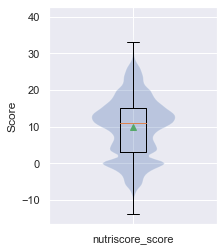

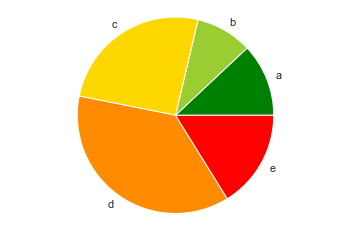

In [32]:
plot_box_and_violin(nutriscore_df[nutriscore_df.index.isin(food_groups_df[food_groups_df.pnns_groups_1 == 'unknown'
                                                                          ].index.values)], 
                    ['nutriscore_score'], 
                    ylabel = 'Score', figsize = (3,4), name = 'nutriscore_score_unknown', savefigure = save_figures)

plot_pie_value_counts(nutriscore_df[nutriscore_df.index.isin(food_groups_df[food_groups_df.pnns_groups_1 == 'unknown'
                                                                            ].index.values)].nutriscore_grade, 
                     group_values, name = 'nutriscore_grade_unknown', savefigure = save_figures,
                     colors = nutri_score_colors)

<a id="Section4"></a>
## 4 Analyses multivariées

### 4.1 Les Informations Nutritionelles
Regarde les corrélations entre les valeurs nutritionnelles des produits alimentaires. 
* Comme attendu les sous-catégories (e.g. acides gras saturés, sucres) sont positivement correlées avec leur catégorie 'mère' (e.g. glucides, matière grasse).
* Le sel n'est pas correlé avec les autres valeurs nutritionelles.
* Le variable 'autres' est negativement correlée avec valeurs nutritionnelles. 

Text(0.5, 1.0, 'Matrix de Corrélation')

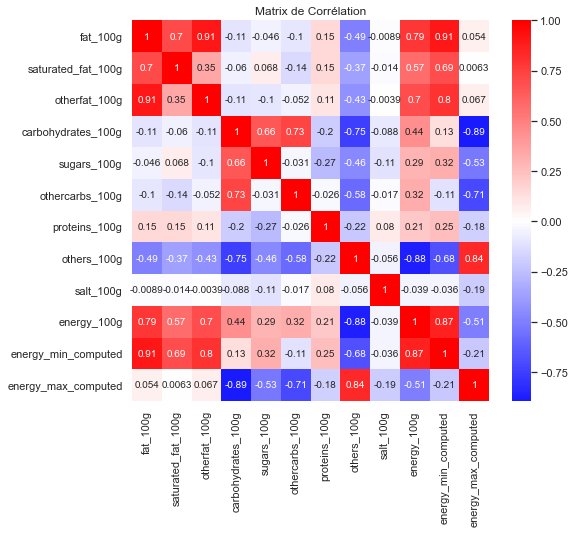

In [33]:
corr = nutritional_values_df[nutritional_composition + nutritional_energy].corr()
#mask = np.zeros_like(corr)
#mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize = (8,7))
#sns.heatmap(corr, mask = mask, center = 0, cmap = 'bwr', annot = True)
sns.heatmap(corr, center = 0, cmap = 'bwr', annot = True, ax = ax)
ax.set_title("Matrix de Corrélation")

In [34]:
nutritional_values_df[nutritional_composition + nutritional_energy].join(nutriscore_df.nutriscore_score).dropna()

,fat_100g,saturated_fat_100g,otherfat_100g,carbohydrates_100g,sugars_100g,othercarbs_100g,proteins_100g,others_100g,salt_100g,energy_100g,energy_min_computed,energy_max_computed,nutriscore_score
id_index,,,,,,,,,,,,,
16,0.3,0.1,0.2,5.3,3.9,1.4,0.9,93.08,0.42,134.0,85.38,3644.624,1.0
25,22.0,15.5,6.5,27.3,21.9,5.4,4.6,46.00,0.10,1594.0,1207.37,3161.410,14.0
35,0.0,0.0,0.0,36.0,27.0,9.0,0.6,63.40,0.00,657.0,423.00,3080.220,-2.0
39,12.7,1.0,11.7,3.9,1.0,2.9,1.9,81.23,0.27,598.0,506.39,3656.734,1.0
64,33.0,21.6,11.4,0.1,0.1,0.0,25.0,40.60,1.30,1661.0,1608.63,3221.450,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1907298,6.1,4.3,1.8,21.0,14.0,7.0,2.9,69.92,0.08,628.0,482.87,3317.006,7.0
1907300,27.0,17.0,10.0,19.0,18.0,1.0,6.0,47.81,0.19,1448.0,1351.80,3288.118,17.0
1907302,0.5,0.0,0.5,80.0,0.0,80.0,7.0,12.50,0.00,1469.0,133.60,2109.900,0.0


In [35]:
nutritional_values_df[nutritional_composition + nutritional_energy]

,fat_100g,saturated_fat_100g,otherfat_100g,carbohydrates_100g,sugars_100g,othercarbs_100g,proteins_100g,others_100g,salt_100g,energy_100g,energy_min_computed,energy_max_computed
id_index,,,,,,,,,,,,
1,7.0,3.08,3.92,70.1,15.0,55.1,7.8,13.70,1.40,1569.0,611.60,2229.830
7,0.0,0.00,0.00,4.8,0.4,4.4,0.2,92.96,2.04,88.0,9.42,3607.148
8,3.0,1.00,2.00,10.0,3.0,7.0,2.0,83.85,1.15,251.0,187.50,3504.930
14,0.0,0.00,0.00,15.5,15.5,0.0,0.2,84.30,0.00,264.0,240.45,3479.890
16,0.3,0.10,0.20,5.3,3.9,1.4,0.9,93.08,0.42,134.0,85.38,3644.624
...,...,...,...,...,...,...,...,...,...,...,...,...
1907302,0.5,0.00,0.50,80.0,0.0,80.0,7.0,12.50,0.00,1469.0,133.60,2109.900
1907305,11.0,1.30,9.70,58.0,54.0,4.0,6.3,24.68,0.02,1556.0,1328.35,2543.554
1907307,20.2,6.00,14.20,30.9,10.4,20.5,7.4,40.40,1.10,1393.0,1012.46,2998.010


Text(0.5, 1.0, 'Matrix de Corrélation')

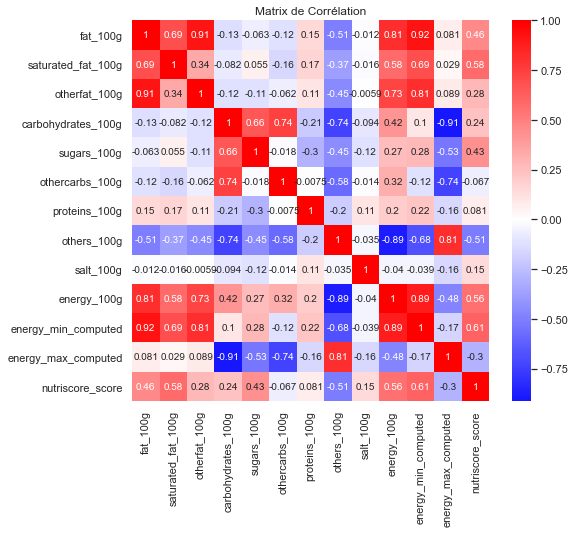

In [36]:
corr = nutritional_values_df[nutritional_composition + nutritional_energy].join(nutriscore_df.nutriscore_score).dropna().corr()
#mask = np.zeros_like(corr)
#mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize = (8,7))
#sns.heatmap(corr, mask = mask, center = 0, cmap = 'bwr', annot = True)
sns.heatmap(corr, center = 0, cmap = 'bwr', annot = True, ax = ax)
ax.set_title("Matrix de Corrélation")

### 4.2 Les Informations Nutritionnelles et les Catégories d'Alimentation

### 4.2.1 Les groupes PNNS

In [37]:
features = nutritional_composition + nutritional_energy
X = nutritional_values_df[features].copy()

In [38]:
group_column = 'pnns_groups_1'
group_values = pnns_groups_1_values
X[group_column] = food_groups_df.loc[X.index, group_column].copy()

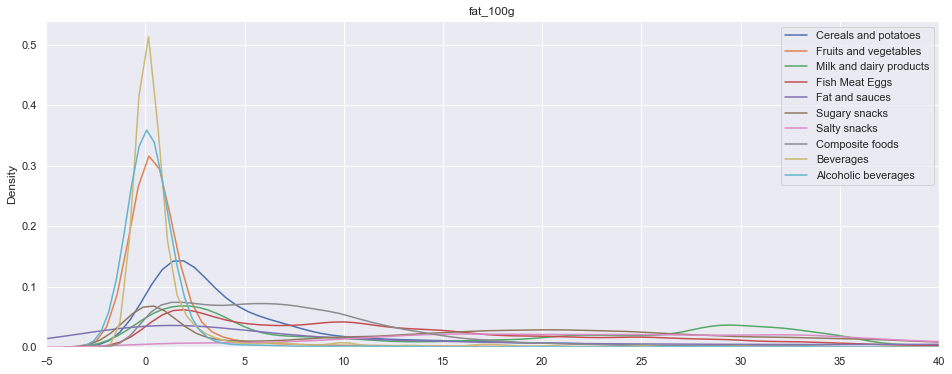

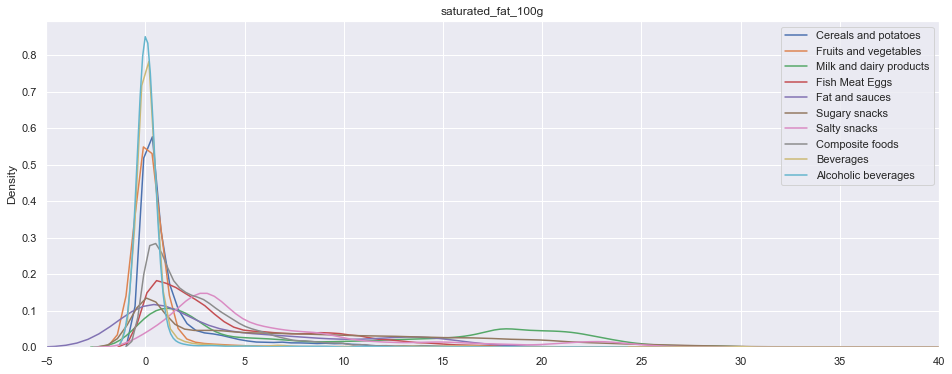

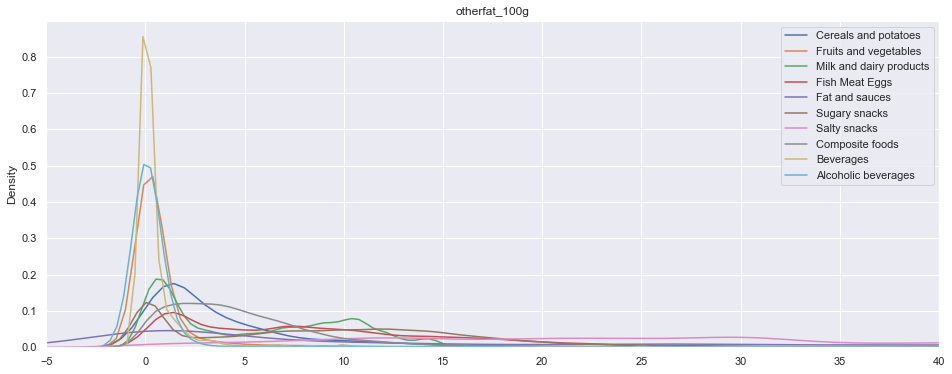

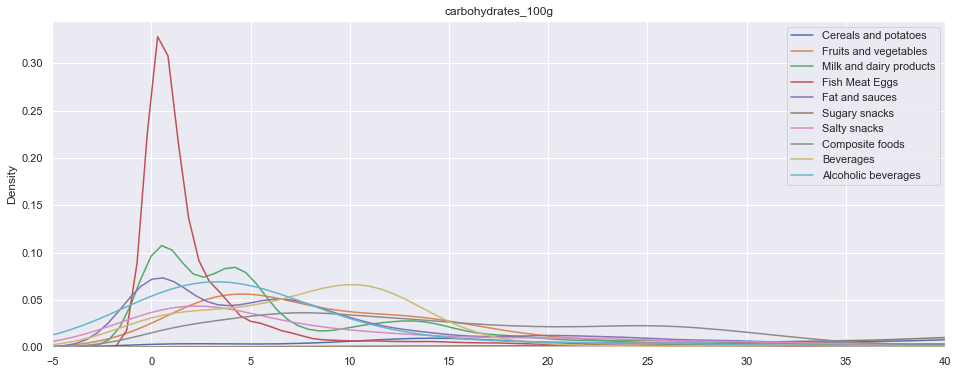

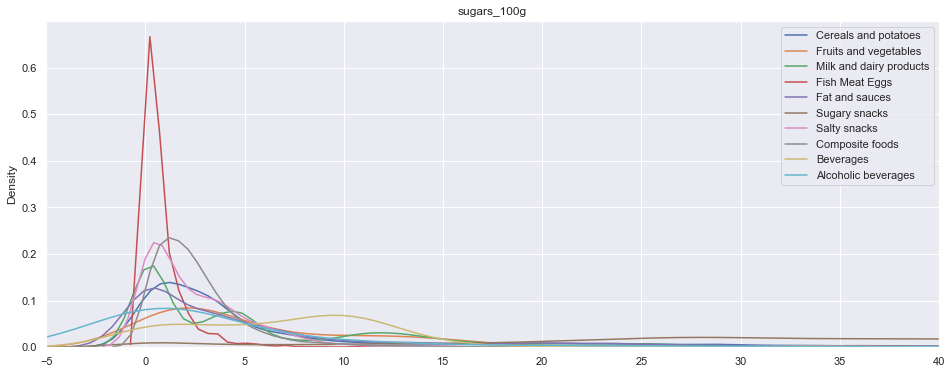

...

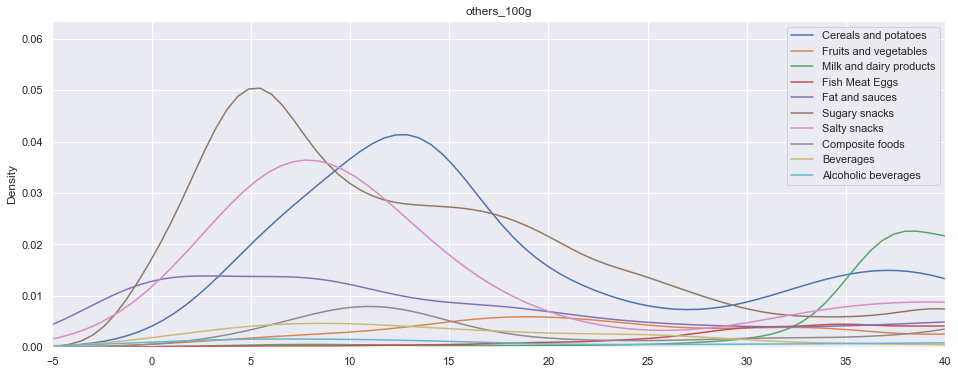

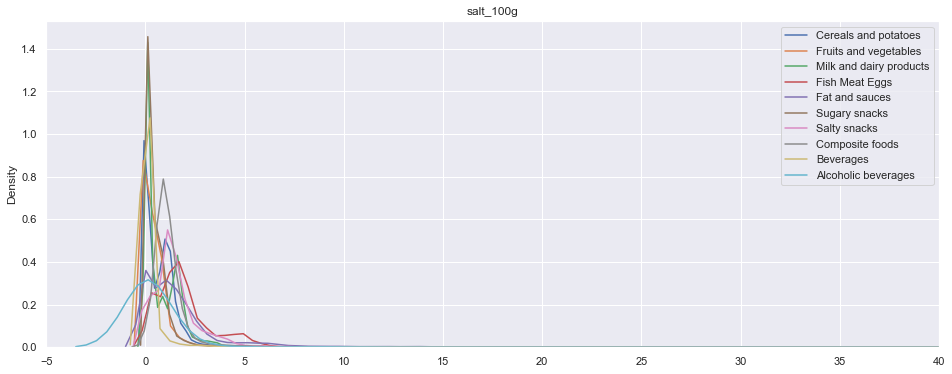

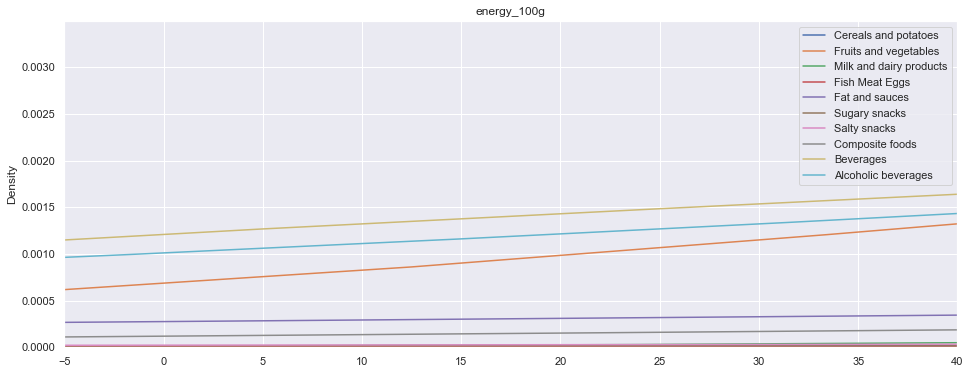

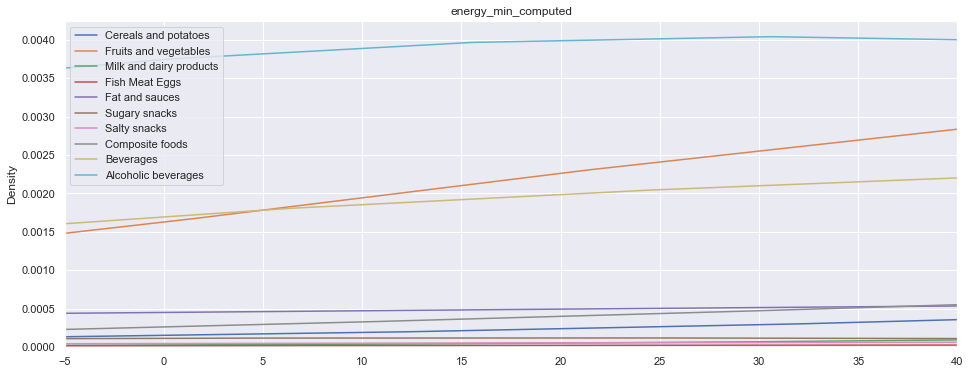

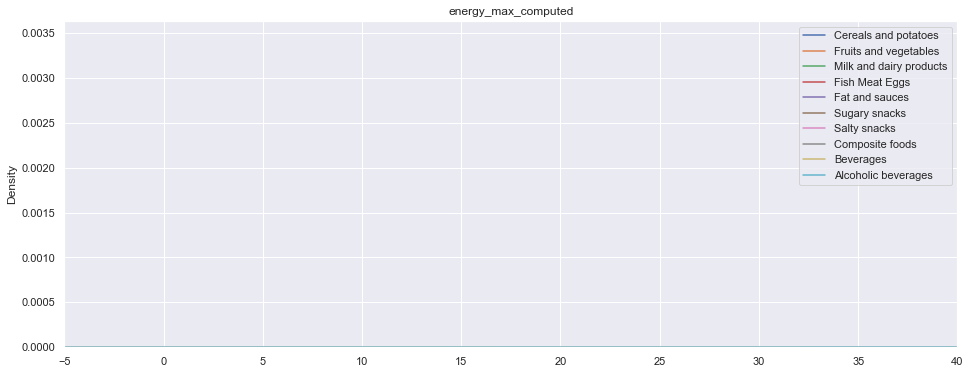

In [39]:
plot_feature_density_for_groups(X,features,group_column, group_values, figsize = (16,6), 
                                name = group_column, xlim = (-5,40))

In [40]:
print("Eta Squared for", group_column)
eta_2_list = []
for feature in features :
    eta_2 = eta_squared(X[X[group_column] != 'unknown'][group_column], X[X[group_column] != 'unknown'][feature])
    eta_2_list.append(eta_2)
    print(feature, eta_2 , sep = '\t\t')
print(np.array(eta_2_list).mean())

Eta Squared for pnns_groups_1
fat_100g		0.2593640413593989
saturated_fat_100g		0.17143265032515984
otherfat_100g		0.28457018948559243
carbohydrates_100g		0.6272663707167567
sugars_100g		0.512697033054279
othercarbs_100g		0.5213011647643204
proteins_100g		0.42764200819898707
others_100g		0.5046907898065257
salt_100g		0.10870329166154342
energy_100g		0.36452071115773205
energy_min_computed		0.306001751115717
energy_max_computed		0.5466344937296697
0.38623537461464025


In [41]:
group_column = 'pnns_groups_2'
group_values = pnns_groups_2_values
X[group_column] = food_groups_df.loc[X.index, group_column].copy()

In [42]:
print("Eta Squared for", group_column)
eta_2_list = []
for feature in features :
    eta_2 = eta_squared(X[X[group_column] != 'unknown'][group_column], X[X[group_column] != 'unknown'][feature])
    eta_2_list.append(eta_2)
    print(feature, eta_2 , sep = '\t\t')
print(np.array(eta_2_list).mean())

Eta Squared for pnns_groups_2
fat_100g		0.6092456642788606
saturated_fat_100g		0.4638495225296423
otherfat_100g		0.5458760132310816
carbohydrates_100g		0.7331915996013254
sugars_100g		0.652212483090769
othercarbs_100g		0.6577220326270226
proteins_100g		0.6011048378963094
others_100g		0.6818542483820015
salt_100g		0.19080391547904338
energy_100g		0.6456325933337866
energy_min_computed		0.6261706089111914
energy_max_computed		0.6545032395426872
0.5885138965753101


### 4.2.2 Les NOVA groups

In [43]:
group_column = 'nova_group'
group_values = nova_group_values
X[group_column] = food_groups_df.loc[X.index, group_column].copy()

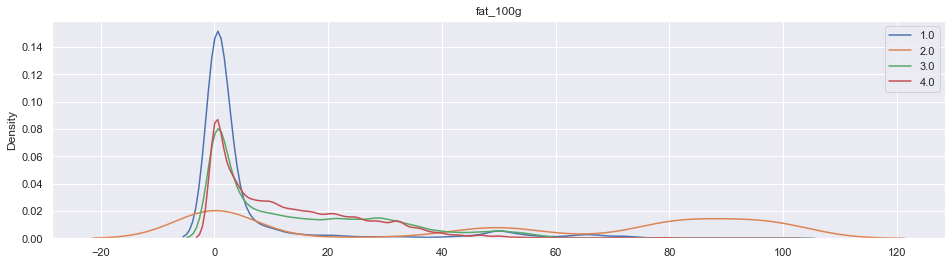

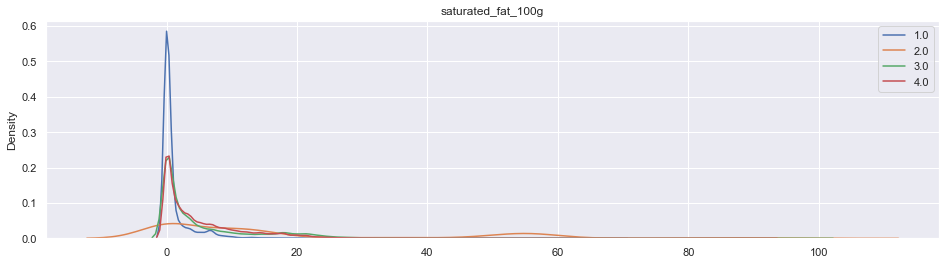

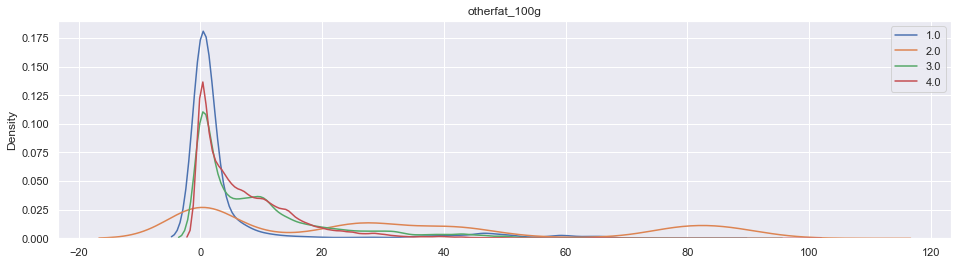

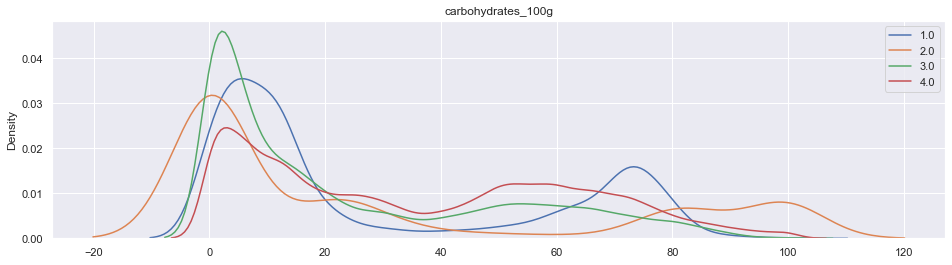

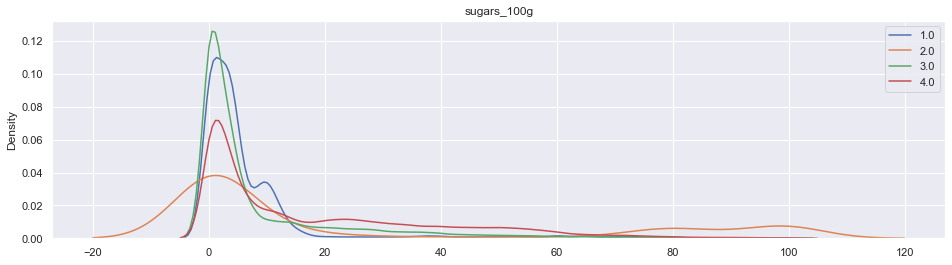

...

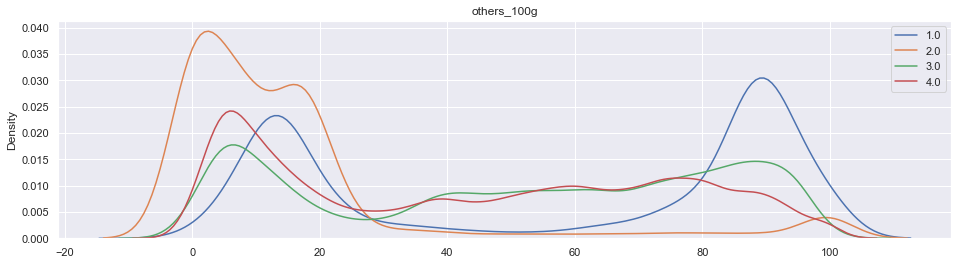

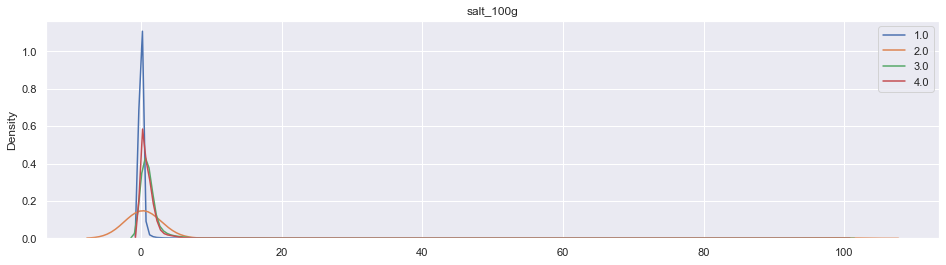

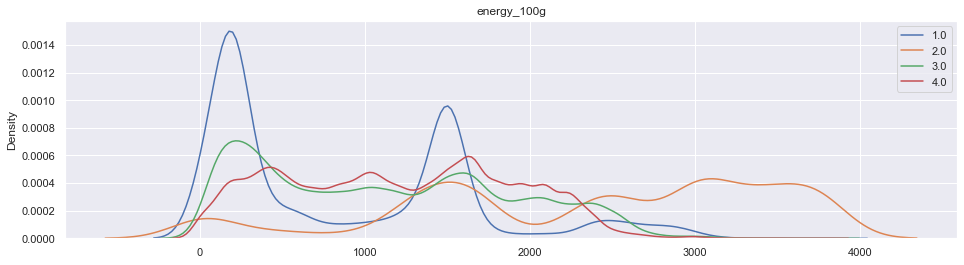

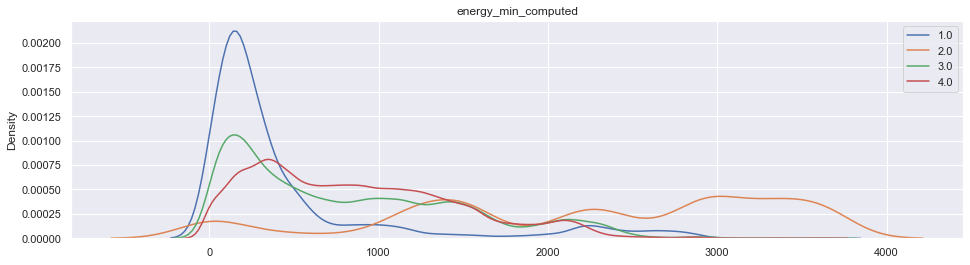

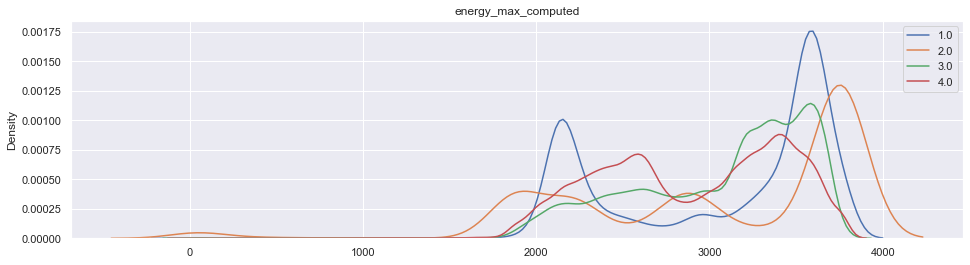

In [44]:
plot_feature_density_for_groups(X,features,group_column, group_values, figsize = (16,4),
                                name = group_column, savefigure = save_figures)

In [45]:
print("Eta Squared")
print(group_column)
eta_2_list = []
for feature in features :
    eta_2 = eta_squared(X[X[group_column] != 'unknown'][group_column], X[X[group_column] != 'unknown'][feature])
    eta_2_list.append(eta_2)
    print(feature, eta_2 , sep = '\t\t')
print(np.array(eta_2_list).mean())

Eta Squared
nova_group
fat_100g		0.08869492002588293
saturated_fat_100g		0.06686476950747816
otherfat_100g		0.06369609132552083
carbohydrates_100g		0.030700536794455193
sugars_100g		0.06186735327397604
othercarbs_100g		0.011666197597358763
proteins_100g		0.01386440731472838
others_100g		0.03331182236561201
salt_100g		0.010035430790172866
energy_100g		0.05353101234114004
energy_min_computed		0.08933141777705834
energy_max_computed		0.020627053163413348
0.04534925102306642


In [46]:
groupX = "nova_group"
groupY = "pnns_groups_1"

cont = food_groups_df[(food_groups_df[groupX] != 'unknown') & (food_groups_df[groupY] != 'unknown')][[groupX,groupY]].pivot_table(
        index=groupX,columns=groupY,aggfunc=len,margins=True,margins_name="Total")
#cont.drop('unknown', inplace = True)
#cont.drop('unknown', axis = 1, inplace = True)
cont

pnns_groups_1,Alcoholic beverages,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,Total
nova_group,,,,,,,,,,,
1.0,4.0,12899.0,14797.0,NaN,851.0,4228.0,12758.0,4205.0,1561.0,281.0,51584
2.0,1.0,4.0,102.0,NaN,7598.0,8.0,13.0,7.0,62.0,3350.0,11145
3.0,4598.0,4543.0,12357.0,8404.0,11590.0,12457.0,12427.0,17574.0,8251.0,10589.0,102790
4.0,1572.0,34377.0,26140.0,30368.0,24231.0,27414.0,7066.0,31929.0,7786.0,88433.0,279316
Total,6175.0,51823.0,53396.0,38772.0,44270.0,44107.0,32264.0,53715.0,17660.0,102653.0,444835


In [47]:
sp.stats.chi2_contingency(cont.fillna(0).iloc[:-1,:-1])

(160937.01009865967,
 0.0,
 27,
 array([[  716.06595704,  6009.50382052,  6191.91220115,  4496.08247552,
          5133.64209201,  5114.74026999,  3741.40113975,  6228.90411051,
          2047.89065609, 11903.85727742],
        [  154.70989243,  1298.38554745,  1337.79585689,   971.40274484,
          1109.15092113,  1105.06708105,   808.34979262,  1345.78815741,
           442.45776524,  2571.89224094],
        [ 1426.88468758, 11974.97087684, 12338.4509762 ,  8959.2183169 ,
         10229.66560635, 10192.00047209,  7455.38583969, 12412.16372363,
          4080.77466926, 23720.48483145],
        [ 3877.33946295, 32540.13975519, 33527.84096575, 24345.29646273,
         27797.54138051, 27695.19217687, 20258.86322794, 33728.14400845,
         11088.87690942, 64456.76565018]]))

Measure: 160937.01009865967


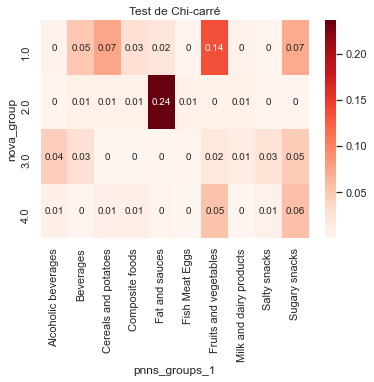

In [48]:
tx = pd.DataFrame(cont['Total'])
ty = pd.DataFrame(cont.T['Total'])
#print(tx)
tx.columns = ["foo"]
ty.columns = ["foo"]
n = tx.iloc[-1]["foo"]
indep = tx.dot(ty.T) / n

c = cont.fillna(0) # Null values are replaced by 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
print("Measure:", xi_n)
fig, ax = plt.subplots()
sns.heatmap((measure/xi_n).iloc[:-1,:-1], annot=round((measure/xi_n).iloc[:-1,:-1], 2), cmap="Reds", ax = ax)
ax.set_title("Test de Chi-carré")
plt.show()

### 4.3 PCA

In [49]:
#rescale X in preparation for PCA and KMeans-clustering

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[features]) #note that X_scaled is an array!
X_scaled = pd.DataFrame(X_scaled, index = X.index, columns = X[features].columns)

In [50]:
#This take a long time to run
if do_long_computations :
    X_scaled.plot(kind = 'density', figsize = (16,4), xlim = (-10,10))
    if save_figures:
        plt.savefig(os.getcwd() + '\\Figures\\' + 'Features_ScaledDensity', dpi = 200)

In [51]:
# Select the number of principal components we will return
num_components = len(X_scaled.columns)

# Create the PCA model
pca = PCA(n_components=num_components)

# Fit the model with the standardised data
pca.fit(X_scaled)

PCA(n_components=12)

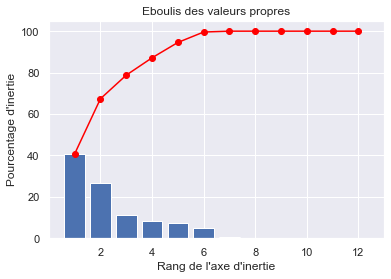

In [52]:
display_scree_plot(pca, name='PCA', savefigure = save_figures)

In [53]:
pcs = pca.components_ 
if print_details :
    print(X_scaled.columns.values)
    for i in pcs:
        print(i) 

['fat_100g' 'saturated_fat_100g' 'otherfat_100g' 'carbohydrates_100g'
 'sugars_100g' 'othercarbs_100g' 'proteins_100g' 'others_100g' 'salt_100g'
 'energy_100g' 'energy_min_computed' 'energy_max_computed']
[ 3.38165238e-01  2.60664059e-01  2.94711701e-01  2.42092284e-01
  1.78579889e-01  1.59823719e-01  9.27157977e-02 -4.24622464e-01
  3.97751290e-04  4.39358063e-01  3.97626384e-01 -2.73418357e-01]
[ 0.35588351  0.2605286   0.31820238 -0.46231116 -0.25828161 -0.38006063
  0.11776831  0.18007076 -0.01130361  0.05112016  0.23645049  0.41759695]
[-0.02417216 -0.09522051  0.02362831 -0.13468086 -0.54412936  0.31345791
  0.57816777 -0.09321241  0.43116134  0.01837862 -0.11687853 -0.18561768]
[-0.08483281  0.15774347 -0.20414593 -0.06082892  0.40599453 -0.44803225
  0.08678314 -0.00763439  0.71185132 -0.0832123   0.11396857 -0.15081512]
[ 0.1709085  -0.16802727  0.32388136  0.03885645 -0.18531753  0.21922886
 -0.68871491  0.02461632  0.51463474  0.01960786 -0.08257689  0.08220563]
[ 0.0249658

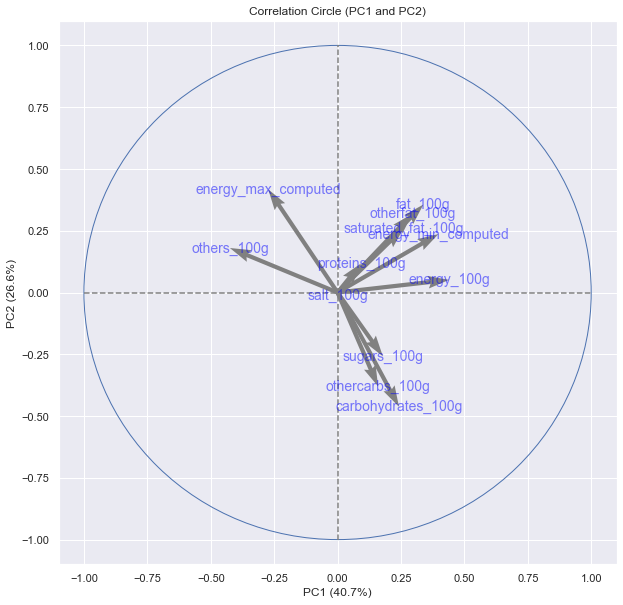

In [54]:
# Generate a correlation circle
display_circles(pcs, num_components, pca, [(0,1)], labels = np.array(X_scaled.columns),) 

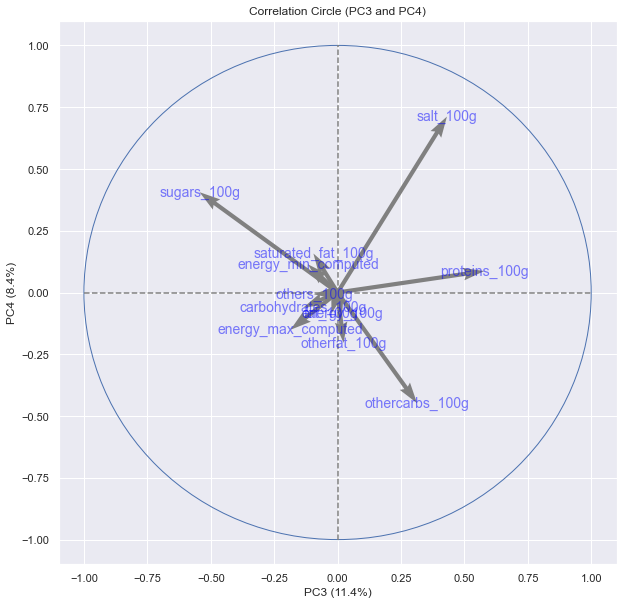

In [55]:
# Generate a correlation circle
display_circles(pcs, num_components, pca, [(2,3)], labels = np.array(X_scaled.columns),) 

In [56]:
# Transform the original scaled data to the new vector space
X_projected = pca.transform(X_scaled) #again an array is returned
pca_features = ['PC'+ str(i+1) for i in range(len(X_projected[0]))]
# Convert to a data frame
X_projected = pd.DataFrame(X_projected, index=X.index, columns=pca_features)

In [57]:
group_column = 'pnns_groups_1'
X_projected[group_column] = X[group_column].copy()

print("Eta Squared")
print(group_column)
eta_2_list = []
for pca_feature in pca_features :
    eta_2 = eta_squared(X_projected[X_projected[group_column] != 'unknown'][group_column], 
                        X_projected[X_projected[group_column] != 'unknown'][pca_feature])
    eta_2_list.append(eta_2)
    print(pca_feature, eta_2, sep = '\t\t')
print(np.array(eta_2_list).mean())

Eta Squared
pnns_groups_1
PC1		0.40598183140871835
PC2		0.4390447064044991
PC3		0.46101656535474295
PC4		0.2916300523943804
PC5		0.3854809226495237
PC6		0.09718532746805474
PC7		0.010233687438645816
PC8		0.2568196743175852
PC9		0.6133743285942461
PC10		0.24327045507330577
PC11		0.24582075200660536
PC12		0.2576634554708557
0.30896014654843024


In [58]:
group_column = 'pnns_groups_2'
X_projected[group_column] = X[group_column].copy()

print("Eta Squared")
print(group_column)
for pca_feature in pca_features :
    print(pca_feature, eta_squared(X_projected[X_projected[group_column] != 'unknown'][group_column], X_projected[X_projected[group_column] != 'unknown'][pca_feature]),
          sep = '\t\t')

Eta Squared
pnns_groups_2
PC1		0.6668778504839291
PC2		0.6580940250961009
PC3		0.6162165531732618
PC4		0.4413349363202642
PC5		0.5020594938083797
PC6		0.2160854577956678
PC7		0.017339337968171848
PC8		0.37968036256015036
PC9		0.7205466580859022
PC10		0.3967622735579298
PC11		0.4551798720710499
PC12		0.48704449864352545


In [59]:
group_column = 'nova_group'
X_projected[group_column] = X[group_column].copy()

print("Eta Squared")
print(group_column)
for pca_feature in pca_features :
    print(pca_feature, eta_squared(X_projected[X_projected[group_column] != 'unknown'][group_column], X_projected[X_projected[group_column] != 'unknown'][pca_feature]),
          sep = '\t\t')

Eta Squared
nova_group
PC1		0.05775028031100711
PC2		0.047295037686406
PC3		0.029639640696289507
PC4		0.03473786640910566
PC5		0.010544784832026317
PC6		0.001853618193572928
PC7		0.0004942947944462175
PC8		0.022794131911562064
PC9		0.01916582815337001
PC10		0.032982038289450614
PC11		0.02365520270458989
PC12		0.0741376352730432


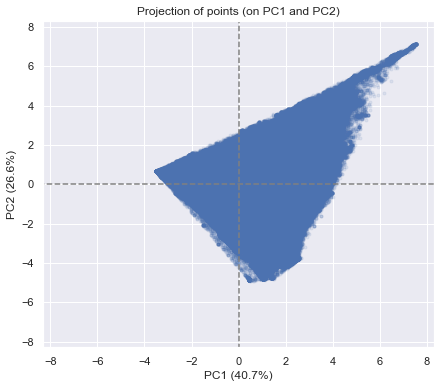

In [60]:
# Display a scatter plot of the data points in this new vector space
display_factorial_planes(X_projected.values, num_components, pca, [(0,1)], alpha = 0.1)
plt.show()

### 4.4 K-Means Clustering

In [61]:
# Run a number of tests, for 1, 2, ... num_clusters
if do_long_computations :
    num_clusters = 20
    kmeans_tests = [KMeans(n_clusters=i, init='random', n_init=10) for i in range(1, num_clusters)]
    score = [kmeans_tests[i].fit(X_scaled).score(X_scaled) for i in range(len(kmeans_tests))]

    # Plot the curve
    plt.plot(range(1, num_clusters),score)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Score')
    plt.title('Elbow Curve')
    if save_figures :
        plt.savefig(os.getcwd() + '\\Figures\\' + 'ElbowCurve_1', dpi = 200)
    plt.show()

#### K-Means with 10 Clusters

In [62]:
# Create a k-means clustering model
num_clusters= 10
kmeans = KMeans(init='random', n_clusters=num_clusters, n_init=10)

# Fit the data to the model
kmeans.fit(X_scaled)

KMeans(init='random', n_clusters=10)

In [63]:
# Determine which clusters each data point belongs to:
clusters =  kmeans.predict(X_scaled) #returns an array

# Add cluster number to the original data
X['cluster_1'] = clusters
X_projected['cluster_1'] = clusters

In [64]:
#project the kmeans cluster centers into PCA - space
centres_projected = pca.transform(kmeans.cluster_centers_)

c:\users\bookj\environments\jupenv\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\users\bookj\environments\jupenv\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


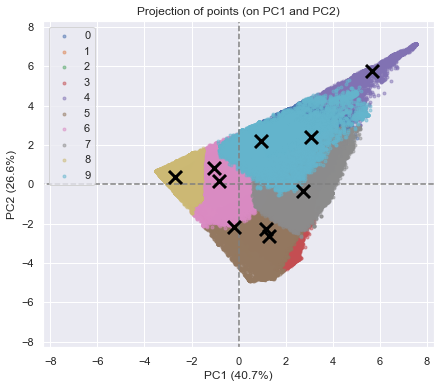

In [69]:
display_factorial_planes(X_projected.values, 2, pca, [(0,1)], illustrative_var = clusters, alpha = 0.5)
plt.scatter(centres_projected[:, 0], centres_projected[:, 1],
            marker='x', s=169, linewidths=3,
            color='black', zorder=10)

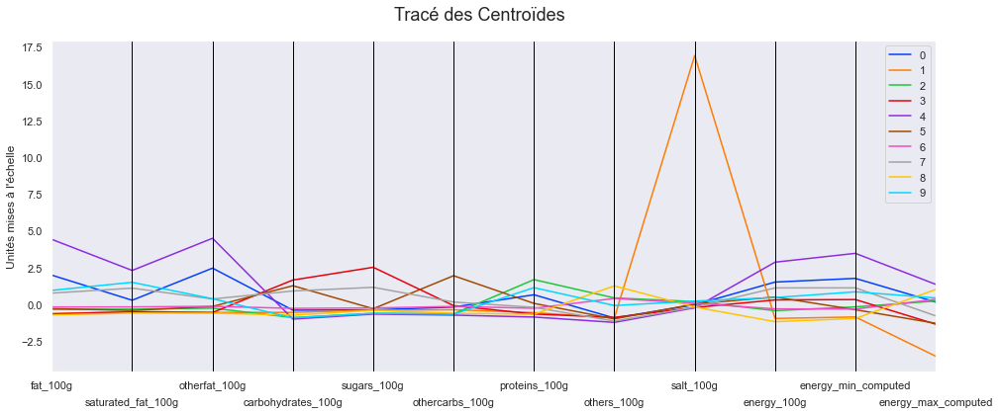

In [70]:
# Create a data frame containing our centroids
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=X_scaled.columns)
centroids['cluster'] = centroids.index

display_parallel_coordinates_centroids(centroids, len(X_scaled.columns), figsize = (16,6), ylabel = "Unités mises à l'échelle")

In [71]:
X_transformed = kmeans.transform(X_scaled) #computed distance to cluster center
X_transformed = pd.DataFrame(X_transformed, index = X_scaled.index, 
                             columns = ['CL'+str(i) for i in range(len(X_transformed[0]))])

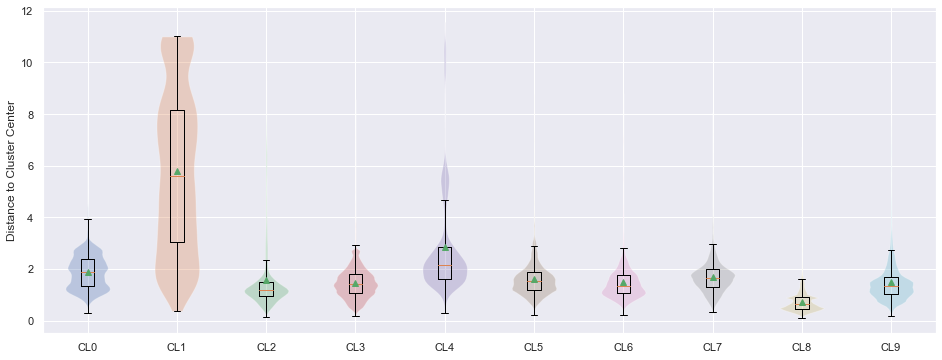

In [72]:
plot_box_and_violin_by_cluster(X_transformed, X.cluster_1, ylabel = "Distance to Cluster Center", figsize =(16,6))

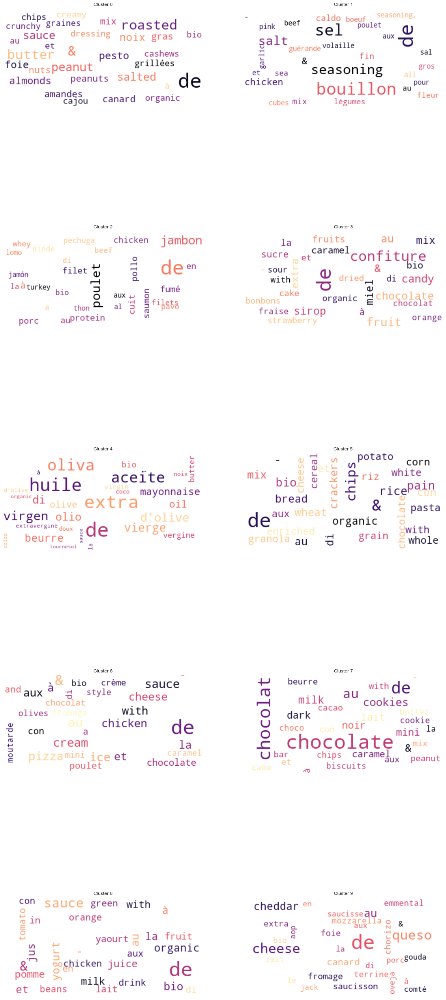

In [73]:
X["product"] = food_info_df.loc[X.index, "product_name"]
X["product"].fillna("unknown", inplace = True)

num_m = len(X["cluster_1"].unique()) // 2


fig, ax = plt.subplots(num_m,2, figsize=(20,50))
for m in range(num_m):
    for n in range(2):
        cluster = m*2+ n
        title = "Cluster " + str(cluster) 
        make_word_cloud(X, 'cluster_1', cluster, ax[m,n], title)

In [74]:
group_column = 'pnns_groups_2'
X[group_column] = food_groups_df.loc[X.index, group_column].copy()

Bread
0    0.002070
2    0.006647
3    0.002179
4    0.000054
5    0.830945
6    0.137837
7    0.009970
8    0.009589
9    0.000708
Name: cluster_1, dtype: float64


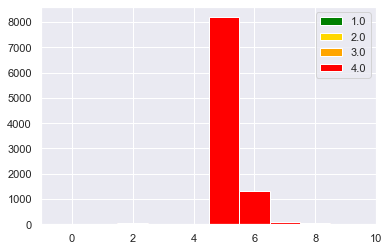

Cereals
0    0.022557
1    0.000031
2    0.008303
3    0.023839
4    0.008852
5    0.767620
6    0.086688
7    0.038766
8    0.037331
9    0.006013
Name: cluster_1, dtype: float64


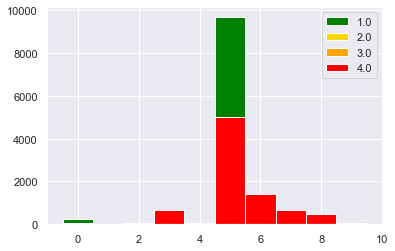

Breakfast cereals
0    0.003865
1    0.000258
2    0.003607
3    0.015202
4    0.000129
5    0.879928
6    0.017006
7    0.067251
8    0.010822
9    0.001932
Name: cluster_1, dtype: float64


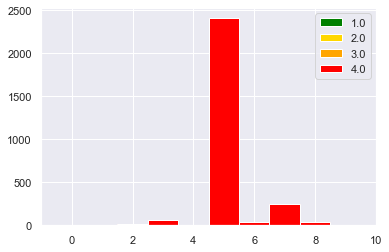

Potatoes
0    0.000463
2    0.001853
3    0.000926
5    0.113478
6    0.519222
7    0.003705
8    0.360352
Name: cluster_1, dtype: float64


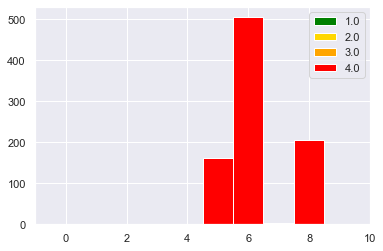

Legumes
0    0.121289
2    0.069608
3    0.000980
4    0.000280
5    0.198880
6    0.064426
7    0.003081
8    0.538375
9    0.003081
Name: cluster_1, dtype: float64


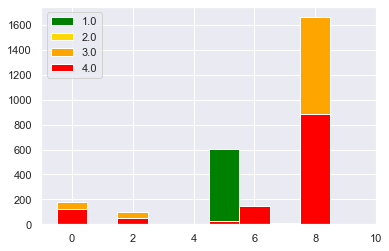

Fruits
0    0.001984
1    0.000189
2    0.000283
3    0.129310
4    0.000378
5    0.006045
6    0.035610
7    0.002550
8    0.816945
9    0.006706
Name: cluster_1, dtype: float64


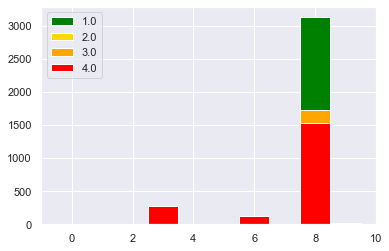

Dried fruits
0    0.057943
2    0.002821
3    0.682509
4    0.003472
5    0.040582
6    0.051215
7    0.103516
8    0.012370
9    0.045573
Name: cluster_1, dtype: float64


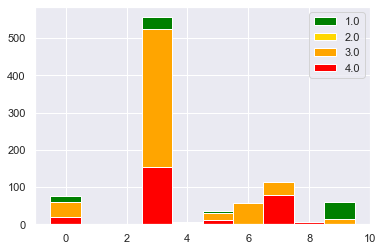

Vegetables
0    0.003575
1    0.000536
2    0.007061
3    0.004603
4    0.000626
5    0.017743
6    0.048268
7    0.006436
8    0.910570
9    0.000581
Name: cluster_1, dtype: float64


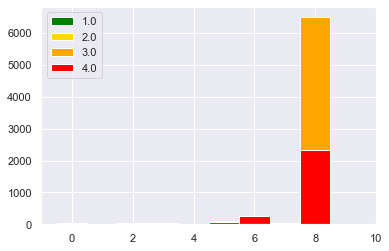

Soups
0    0.000436
1    0.001307
2    0.003920
3    0.001307
5    0.028310
6    0.010453
7    0.000871
8    0.952962
9    0.000436
Name: cluster_1, dtype: float64


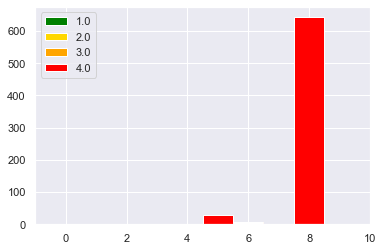

Milk and yogurt
0    0.000345
1    0.000115
2    0.001915
3    0.007888
4    0.000038
5    0.001225
6    0.070685
7    0.003293
8    0.876015
9    0.038482
Name: cluster_1, dtype: float64


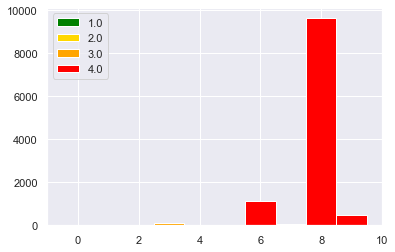

Cheese
0    0.004439
2    0.047052
3    0.000055
4    0.000194
5    0.001276
6    0.071466
7    0.001887
8    0.041975
9    0.831655
Name: cluster_1, dtype: float64


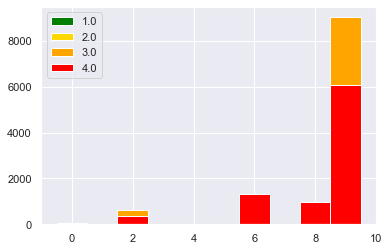

Dairy desserts
0    0.000198
2    0.007335
3    0.009516
5    0.012292
6    0.301348
7    0.009120
8    0.644925
9    0.015266
Name: cluster_1, dtype: float64


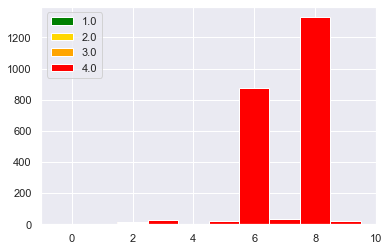

Ice cream
2    0.001087
3    0.001630
5    0.003442
6    0.725725
7    0.077355
8    0.185507
9    0.005254
Name: cluster_1, dtype: float64


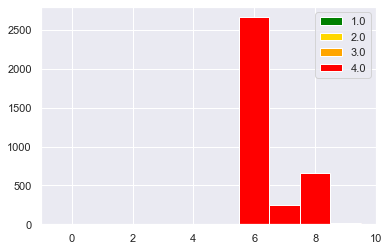

Meat
0    0.003875
1    0.000252
2    0.748490
3    0.000352
4    0.000352
5    0.001560
6    0.107991
7    0.000855
8    0.045390
9    0.090882
Name: cluster_1, dtype: float64


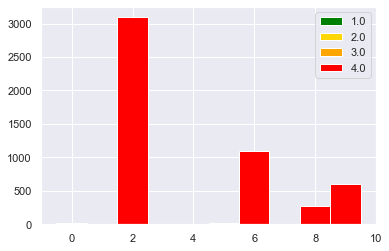

Offals
0    0.003141
2    0.259686
5    0.001047
6    0.504712
7    0.001047
8    0.050262
9    0.180105
Name: cluster_1, dtype: float64


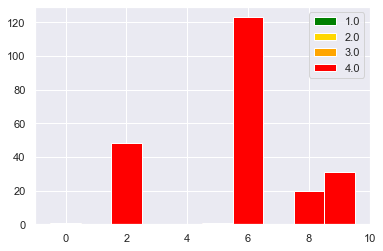

Processed meat
0    0.009729
1    0.000128
2    0.499165
3    0.000096
4    0.000450
5    0.000867
6    0.085281
7    0.000321
8    0.016536
9    0.387426
Name: cluster_1, dtype: float64


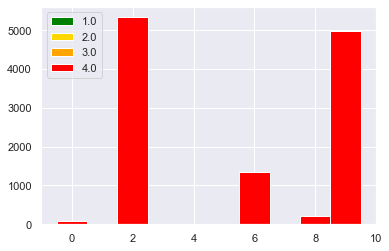

Fish and seafood
0    0.013471
1    0.000284
2    0.658175
3    0.000047
4    0.000047
5    0.002978
6    0.143310
7    0.000378
8    0.135511
9    0.045800
Name: cluster_1, dtype: float64


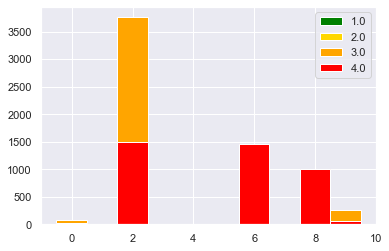

Eggs
0    0.001118
2    0.015651
3    0.000559
5    0.006149
6    0.299609
7    0.006708
8    0.665735
9    0.004472
Name: cluster_1, dtype: float64


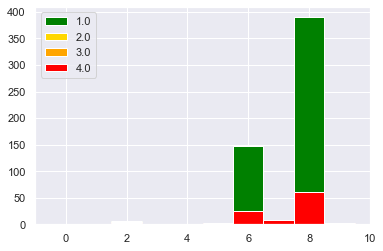

Dressings and sauces
0    0.124789
1    0.000831
2    0.005547
3    0.031298
4    0.047643
5    0.019213
6    0.310083
7    0.006404
8    0.442456
9    0.011737
Name: cluster_1, dtype: float64


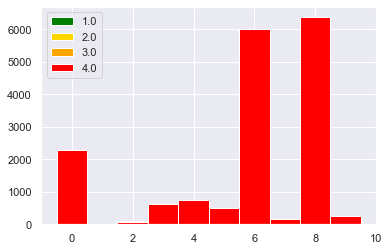

Fats
0    0.124133
1    0.000072
2    0.002094
3    0.001950
4    0.799827
5    0.003105
6    0.013576
7    0.017331
8    0.018703
9    0.019209
Name: cluster_1, dtype: float64


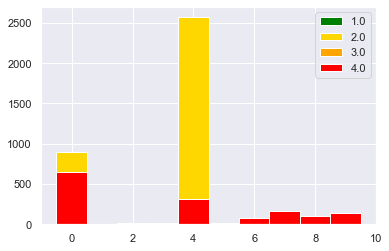

Pastries
0    0.000209
2    0.001045
3    0.006480
4    0.000209
5    0.325669
6    0.128554
7    0.531355
8    0.004390
9    0.002090
Name: cluster_1, dtype: float64


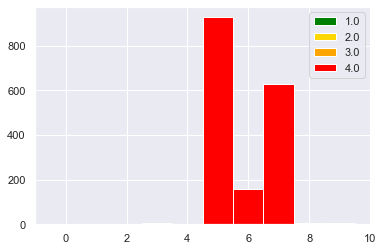

Biscuits and cakes
0    0.005383
1    0.000037
2    0.003533
3    0.112165
4    0.000129
5    0.217857
6    0.083828
7    0.566617
8    0.005697
9    0.004754
Name: cluster_1, dtype: float64


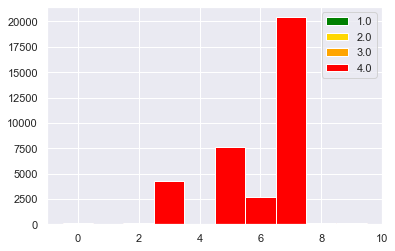

Sweets
0    0.022954
1    0.000152
2    0.000477
3    0.529153
4    0.000173
5    0.046059
6    0.048184
7    0.317626
8    0.033813
9    0.001409
Name: cluster_1, dtype: float64


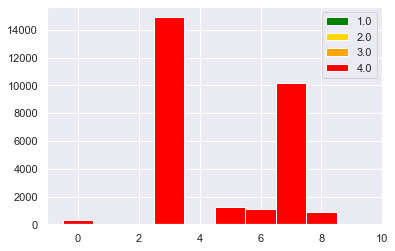

Chocolate products
0    0.013454
2    0.000434
3    0.014495
4    0.000347
5    0.002517
6    0.003038
7    0.907647
8    0.001823
9    0.056245
Name: cluster_1, dtype: float64


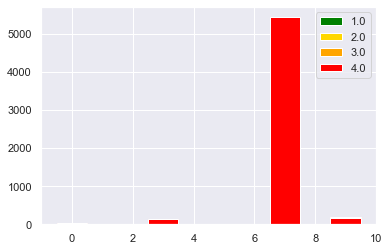

Appetizers
0    0.101266
1    0.000106
2    0.006170
3    0.002447
5    0.677800
6    0.123923
7    0.068610
8    0.010318
9    0.009361
Name: cluster_1, dtype: float64


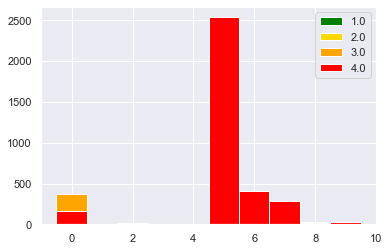

Nuts
0    0.878793
2    0.004568
3    0.004241
4    0.019413
5    0.015987
6    0.022512
7    0.040783
8    0.005546
9    0.008157
Name: cluster_1, dtype: float64


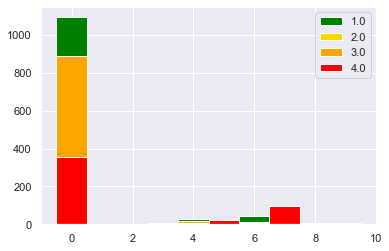

Salty and fatty products
0    0.183591
1    0.000180
2    0.046729
3    0.000359
4    0.026959
5    0.012401
6    0.348940
7    0.001438
8    0.150252
9    0.229152
Name: cluster_1, dtype: float64


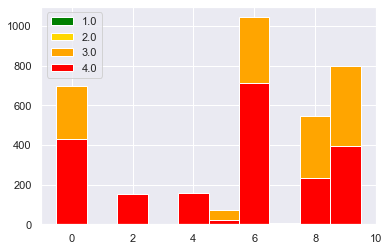

One-dish meals
0    0.006656
1    0.001057
2    0.045847
3    0.001371
4    0.000114
5    0.122801
6    0.327382
7    0.004542
8    0.474177
9    0.016053
Name: cluster_1, dtype: float64


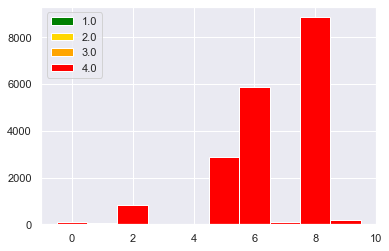

Sandwiches
0    0.001211
2    0.082677
5    0.031799
6    0.852211
7    0.001817
8    0.018474
9    0.011811
Name: cluster_1, dtype: float64


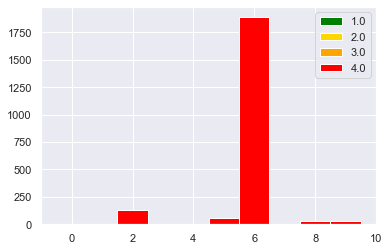

Pizza pies and quiches
0    0.000956
2    0.003006
3    0.007105
5    0.023227
6    0.902992
7    0.047274
8    0.007515
9    0.007925
Name: cluster_1, dtype: float64


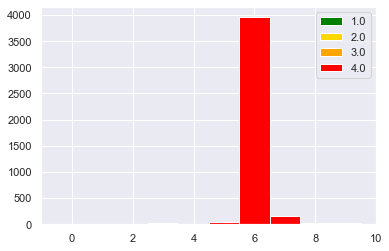

Sweetened beverages
1    0.000634
2    0.008711
3    0.177542
4    0.000079
5    0.007602
6    0.014096
7    0.008948
8    0.782230
9    0.000158
Name: cluster_1, dtype: float64


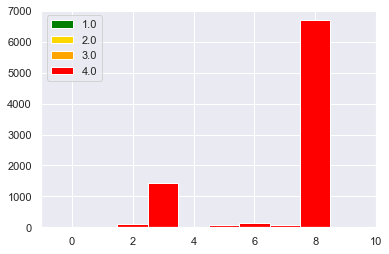

Unsweetened beverages
0    0.002642
1    0.000440
2    0.037722
3    0.025686
4    0.000440
5    0.018494
6    0.008953
7    0.002936
8    0.900338
9    0.002348
Name: cluster_1, dtype: float64


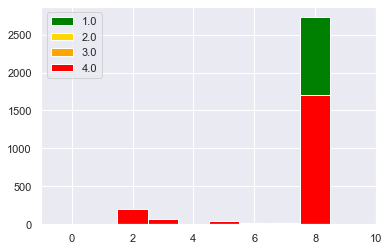

Artificially sweetened beverages
1    0.000770
2    0.053929
3    0.033385
5    0.028249
6    0.008988
7    0.059065
8    0.814587
9    0.001027
Name: cluster_1, dtype: float64


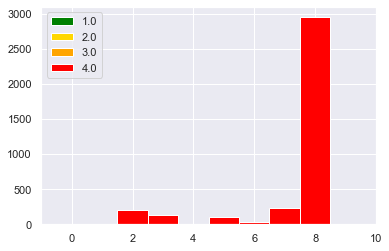

Plant-based milk substitutes
0    0.003909
1    0.001440
2    0.000206
3    0.025103
4    0.000617
5    0.023251
6    0.170165
7    0.043827
8    0.722428
9    0.009053
Name: cluster_1, dtype: float64


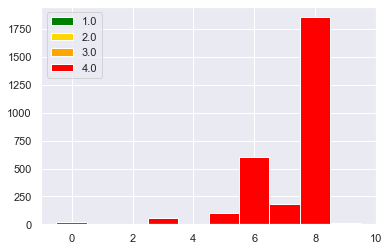

Fruit juices
1    0.000152
2    0.000304
3    0.001974
5    0.002277
6    0.005010
8    0.990284
Name: cluster_1, dtype: float64


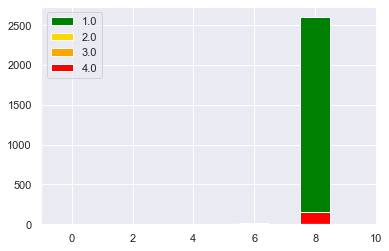

Fruit nectars
3    0.001080
6    0.006479
8    0.992441
Name: cluster_1, dtype: float64


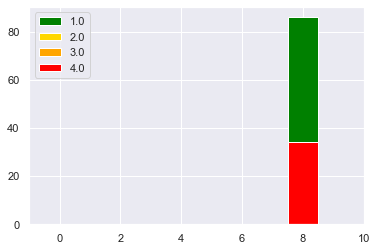

Waters and flavored waters
1    0.004072
2    0.002327
5    0.001163
6    0.004072
7    0.000582
8    0.987784
Name: cluster_1, dtype: float64


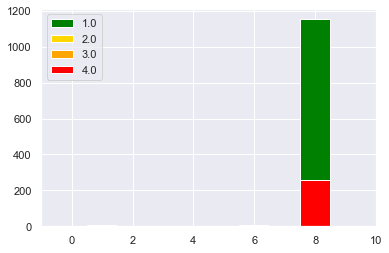

Teas and herbal teas and coffees
3    0.024249
5    0.006928
6    0.011547
7    0.012702
8    0.944573
Name: cluster_1, dtype: float64


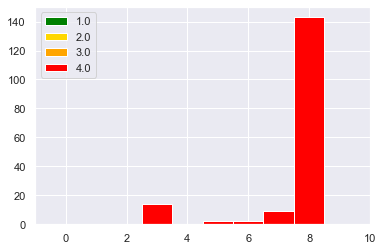

Alcoholic beverages
0    0.000791
1    0.003956
2    0.003956
3    0.035601
4    0.000791
5    0.005538
6    0.037184
7    0.007120
8    0.900316
9    0.004747
Name: cluster_1, dtype: float64


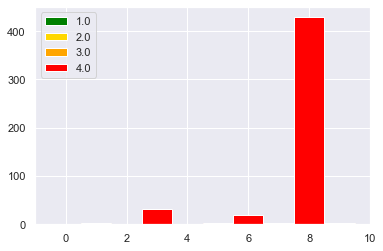

In [75]:
plot_hist_of_groups(X, 'cluster_1', 'pnns_groups_2', sub_group = 'nova_group', 
                    main_group_values = pnns_groups_2_values, sub_group_values = nova_group_values, 
                    sub_group_colors = nova_group_colors,
                    printdetails = True)

#### K-Means with 20 Clusters

In [76]:
# Create a k-means clustering model
num_clusters= 20
kmeans = KMeans(init='random', n_clusters=num_clusters, n_init=10)

# Fit the data to the model
kmeans.fit(X_scaled)

KMeans(init='random', n_clusters=20)

In [77]:
# Determine which clusters each data point belongs to:
clusters =  kmeans.predict(X_scaled) #returns an array

# Add cluster number to the original data
X['cluster_2'] = clusters
X_projected['cluster_2'] = clusters

In [78]:
#project the kmeans cluster centers into PCA - space
centres_projected = pca.transform(kmeans.cluster_centers_)

c:\users\bookj\environments\jupenv\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\users\bookj\environments\jupenv\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


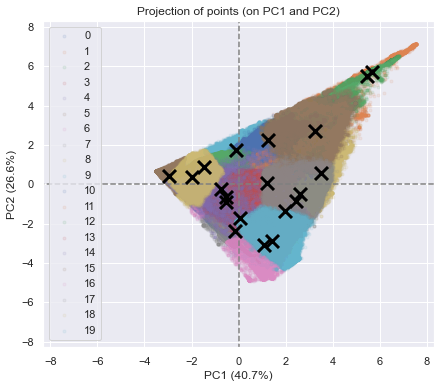

In [79]:
X_projected_reduced = X_projected#.sample(100000)

display_factorial_planes(X_projected_reduced.values, 2, pca, [(0,1)], 
                         illustrative_var = clusters[X_projected_reduced.reset_index().index.values], alpha = 0.1, marker='.')
plt.scatter(centres_projected[:, 0], centres_projected[:, 1],
            marker='x', s=169, linewidths=3,
            color='black', zorder=10)

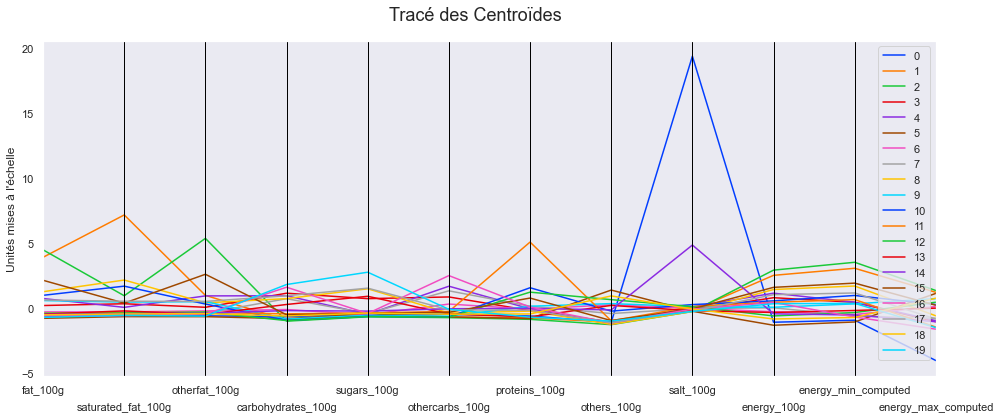

In [80]:
# Create a data frame containing our centroids
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=X_scaled.columns)
centroids['cluster'] = centroids.index

display_parallel_coordinates_centroids(centroids, len(X_scaled.columns), figsize = (16,6), ylabel = "Unités mises à l'échelle")

In [81]:
X_transformed = kmeans.transform(X_scaled) #computed distance to cluster center
X_transformed = pd.DataFrame(X_transformed, index = X_scaled.index, 
                             columns = ['CL'+str(i) for i in range(len(X_transformed[0]))])

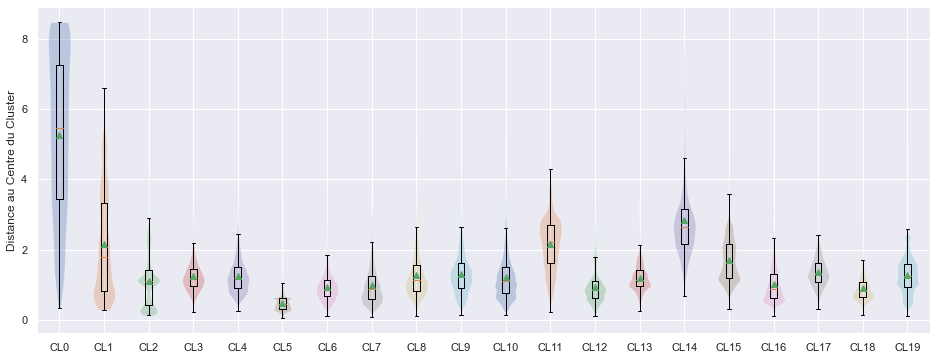

In [82]:
plot_box_and_violin_by_cluster(X_transformed, X.cluster_2, ylabel = "Distance au Centre du Cluster", figsize =(16,6))

Bread
2     0.000054
3     0.014220
4     0.046037
5     0.004141
6     0.062708
7     0.645982
8     0.000163
9     0.002016
10    0.000545
11    0.000599
12    0.005448
13    0.002234
14    0.000545
15    0.000708
16    0.204903
17    0.000545
18    0.007900
19    0.001253
Name: cluster_2, dtype: float64


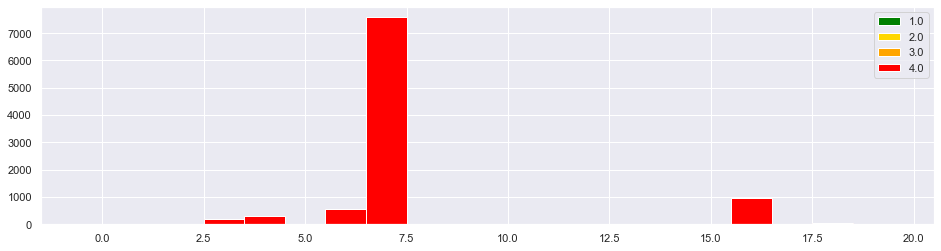

Cereals
1     0.000122
2     0.008760
3     0.083606
4     0.029547
5     0.011172
6     0.061689
7     0.077867
8     0.001465
9     0.008760
10    0.000977
11    0.002167
12    0.006318
13    0.001313
14    0.000733
15    0.018681
16    0.629651
17    0.005616
18    0.032691
19    0.018864
Name: cluster_2, dtype: float64


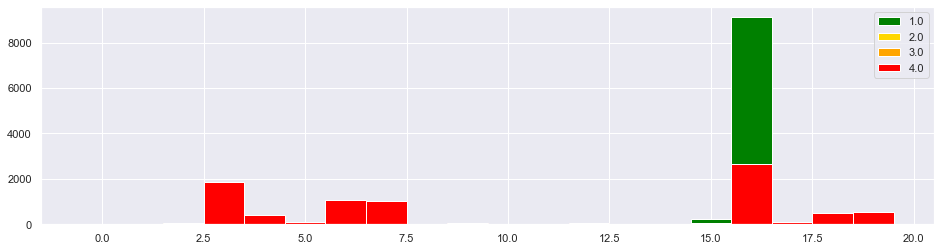

Breakfast cereals
0     0.000129
1     0.000258
3     0.321567
4     0.039680
5     0.001288
6     0.008245
7     0.159753
8     0.001031
9     0.001031
10    0.002448
11    0.001288
12    0.001031
13    0.001546
14    0.000515
15    0.003221
16    0.435584
17    0.002448
18    0.011981
19    0.006957
Name: cluster_2, dtype: float64


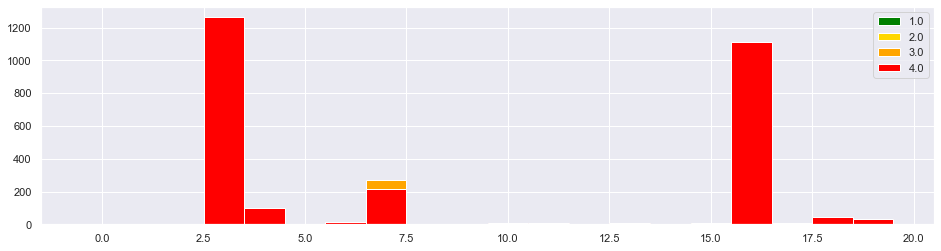

Potatoes
3     0.000926
4     0.008337
5     0.142195
6     0.377953
7     0.029180
8     0.000463
9     0.001390
11    0.000463
12    0.000926
13    0.001390
14    0.001390
15    0.000463
16    0.100973
17    0.000463
18    0.333025
19    0.000463
Name: cluster_2, dtype: float64


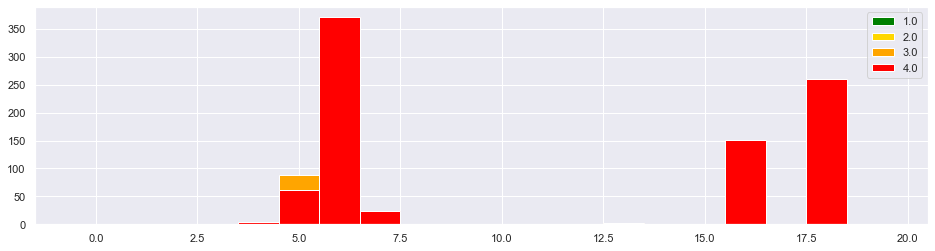

Legumes
1     0.000420
2     0.000280
3     0.000980
4     0.003922
5     0.065826
6     0.024790
7     0.147059
8     0.000980
9     0.005322
10    0.001681
11    0.017647
12    0.045798
13    0.002241
14    0.003641
15    0.119468
16    0.061345
17    0.001961
18    0.496218
19    0.000420
Name: cluster_2, dtype: float64


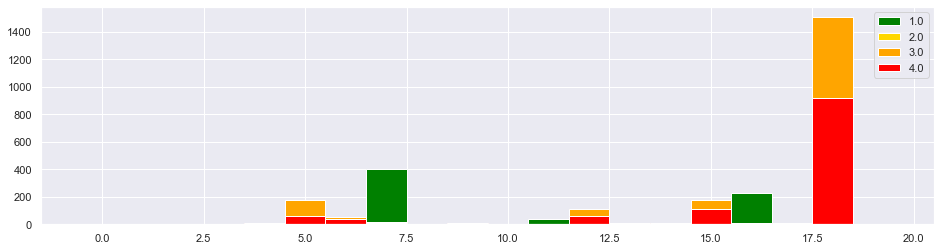

Fruits
0     0.000094
1     0.002834
2     0.000189
3     0.000850
4     0.000094
5     0.714556
6     0.001700
7     0.002078
8     0.000189
9     0.002550
10    0.003873
12    0.000378
13    0.058562
14    0.000756
15    0.001606
16    0.003873
17    0.002267
18    0.095022
19    0.108529
Name: cluster_2, dtype: float64


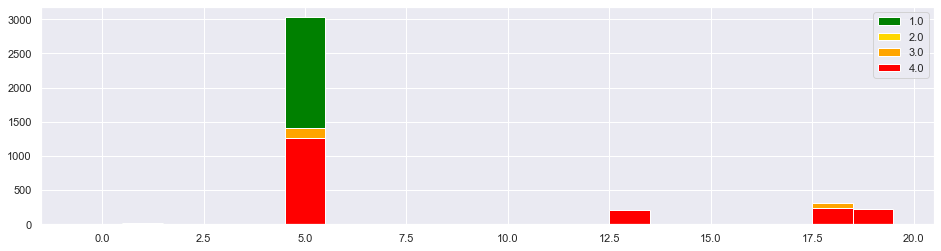

Dried fruits
1     0.041884
2     0.001519
3     0.034722
4     0.009983
5     0.004991
6     0.001953
7     0.017361
8     0.022569
9     0.003038
10    0.004991
11    0.000217
12    0.002170
13    0.202474
14    0.001085
15    0.047526
16    0.015625
17    0.065538
18    0.009332
19    0.513021
Name: cluster_2, dtype: float64


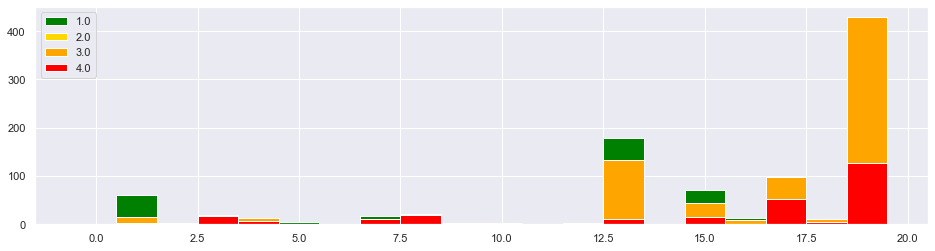

Vegetables
0     0.000358
1     0.000179
2     0.000447
3     0.001698
4     0.004380
5     0.778637
6     0.015240
7     0.007106
8     0.004827
9     0.006972
10    0.000268
11    0.000268
12    0.005765
13    0.010994
14    0.002101
15    0.002324
16    0.008536
17    0.000358
18    0.147531
19    0.002011
Name: cluster_2, dtype: float64


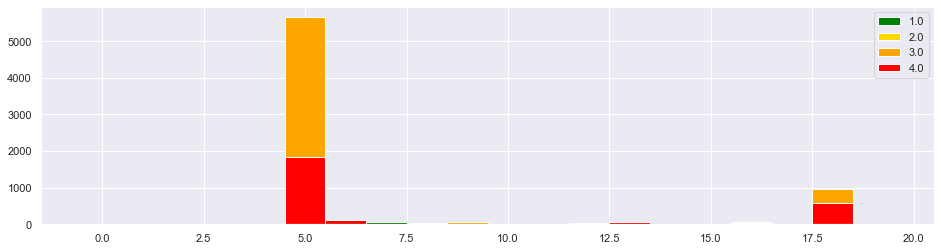

Soups
0     0.000871
3     0.002613
4     0.001742
5     0.918990
6     0.002613
7     0.010017
9     0.001742
11    0.003049
12    0.000436
13    0.000436
14    0.007404
16    0.010453
18    0.039634
Name: cluster_2, dtype: float64


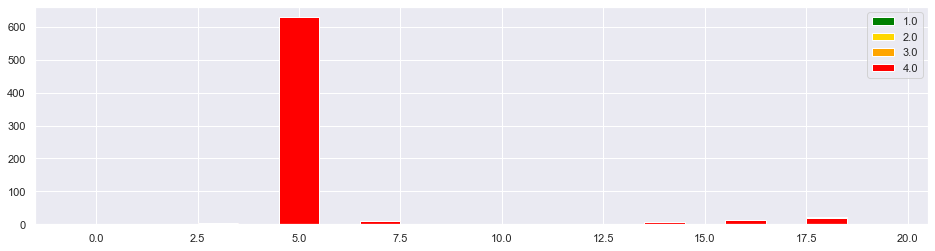

Milk and yogurt
0     0.000038
1     0.000153
2     0.000038
3     0.000689
4     0.000306
5     0.457306
6     0.001608
7     0.000651
8     0.001340
9     0.060499
10    0.002565
11    0.002297
12    0.000766
13    0.007888
14    0.000651
15    0.000115
16    0.000498
17    0.001455
18    0.454511
19    0.006624
Name: cluster_2, dtype: float64


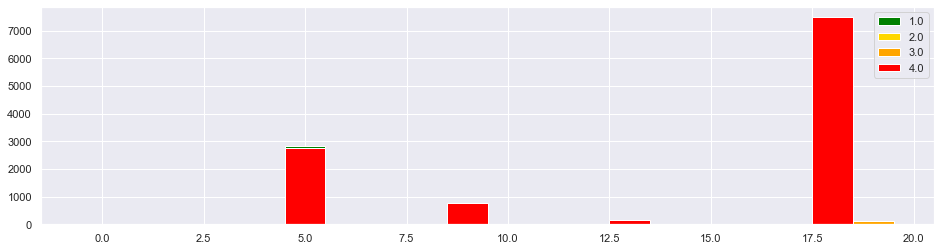

Cheese
1     0.000111
3     0.000527
4     0.001470
5     0.002858
6     0.005743
7     0.000388
8     0.000638
9     0.178055
10    0.712054
11    0.000222
12    0.035789
13    0.001332
14    0.001831
15    0.003940
16    0.000333
17    0.000222
18    0.054487
Name: cluster_2, dtype: float64


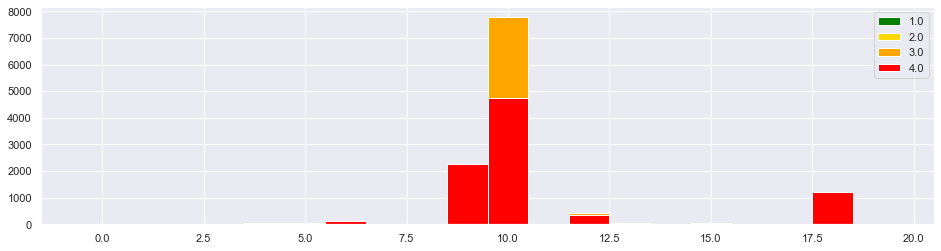

Dairy desserts
3     0.003767
4     0.000198
5     0.098533
6     0.006146
7     0.001586
8     0.001388
9     0.031919
10    0.003370
11    0.001784
12    0.006542
13    0.110626
14    0.000595
15    0.000198
16    0.011102
17    0.003767
18    0.711142
19    0.007335
Name: cluster_2, dtype: float64


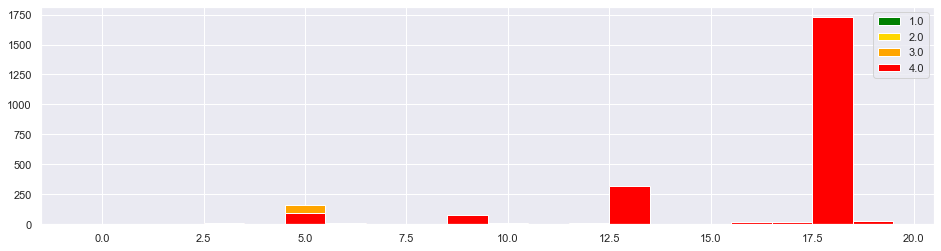

Ice cream
3     0.005978
4     0.000181
5     0.016667
6     0.016667
7     0.002717
8     0.005797
9     0.038768
10    0.000362
11    0.000543
12    0.000725
13    0.750181
14    0.001449
16    0.001449
17    0.023370
18    0.134601
19    0.000543
Name: cluster_2, dtype: float64


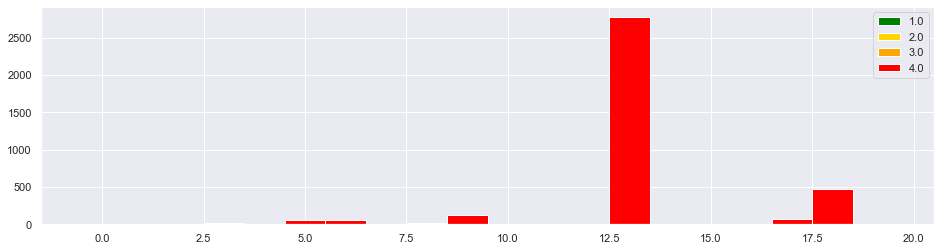

Meat
0     0.000101
1     0.000050
2     0.000050
3     0.000503
4     0.000755
5     0.010819
6     0.053845
7     0.000855
8     0.000252
9     0.129529
10    0.023299
11    0.025362
12    0.715378
13    0.000755
14    0.002919
15    0.003271
16    0.000252
17    0.000151
18    0.031653
19    0.000201
Name: cluster_2, dtype: float64


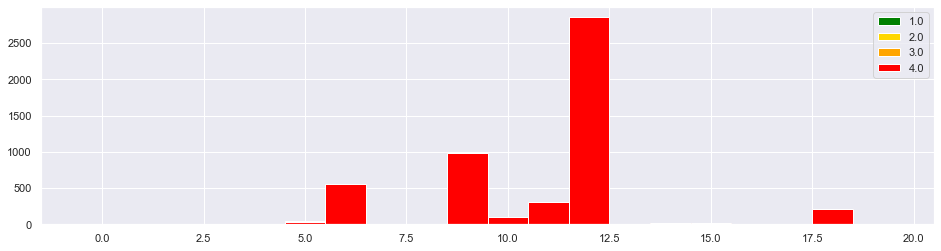

Offals
5     0.004188
6     0.008377
8     0.001047
9     0.605236
10    0.010471
12    0.283770
13    0.001047
14    0.005236
15    0.003141
16    0.001047
18    0.076440
Name: cluster_2, dtype: float64


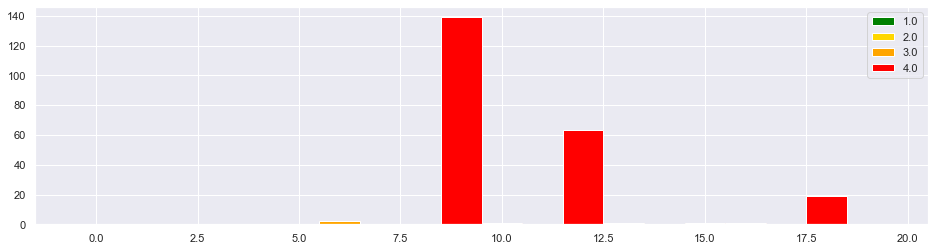

Processed meat
0     0.000096
1     0.000032
2     0.000161
3     0.000096
4     0.000417
5     0.002344
6     0.009761
7     0.000514
8     0.000064
9     0.323112
10    0.179104
11    0.002504
12    0.455208
13    0.000225
14    0.002248
15    0.009536
16    0.000225
17    0.000096
18    0.014192
19    0.000064
Name: cluster_2, dtype: float64


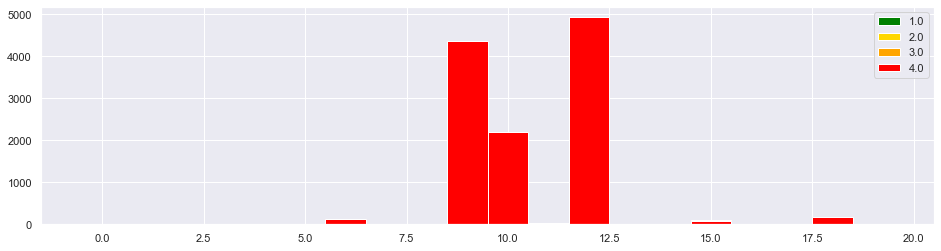

Fish and seafood
0     0.000189
2     0.000047
3     0.000331
4     0.000520
5     0.020655
6     0.055537
7     0.001985
8     0.000047
9     0.119582
10    0.001465
11    0.003923
12    0.666730
13    0.000520
14    0.017488
15    0.008366
16    0.000945
17    0.000189
18    0.101432
19    0.000047
Name: cluster_2, dtype: float64


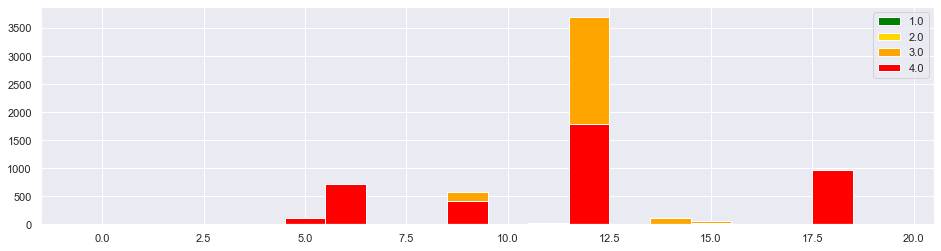

Eggs
3     0.001118
4     0.000559
5     0.102851
6     0.003354
7     0.000559
8     0.003913
9     0.022359
10    0.002236
11    0.000559
12    0.565679
13    0.001118
14    0.000559
15    0.000559
16    0.004472
17    0.002236
18    0.287311
19    0.000559
Name: cluster_2, dtype: float64


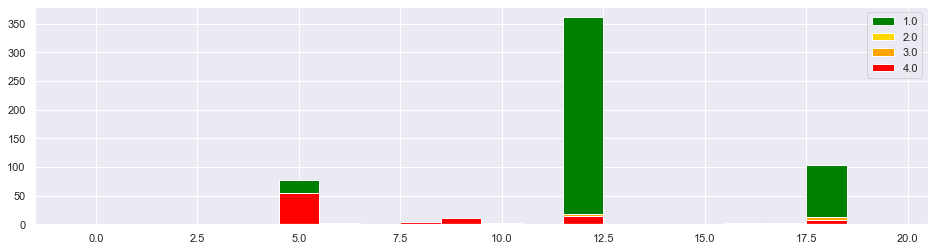

Dressings and sauces
0     0.000214
1     0.000429
2     0.048822
3     0.001929
4     0.006645
5     0.261556
6     0.025992
7     0.003376
8     0.001045
9     0.139393
10    0.002304
11    0.000991
12    0.002251
13    0.107345
14    0.029020
15    0.089150
16    0.005520
17    0.004448
18    0.257912
19    0.011656
Name: cluster_2, dtype: float64


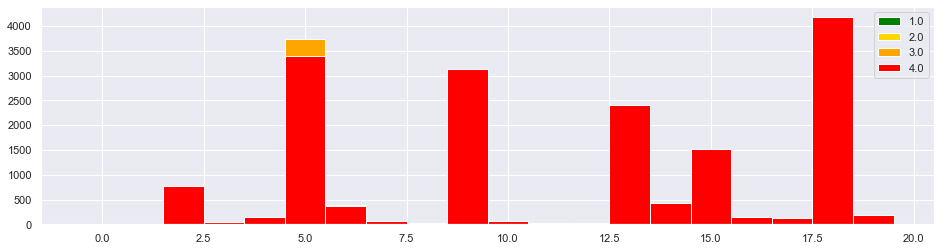

Fats
0     0.000072
1     0.209561
2     0.595682
3     0.002744
4     0.002022
5     0.013793
6     0.000433
7     0.001155
8     0.005777
9     0.017909
10    0.002672
11    0.002311
12    0.000578
13    0.001516
14    0.000144
15    0.123772
16    0.000217
17    0.010904
18    0.007871
19    0.000867
Name: cluster_2, dtype: float64


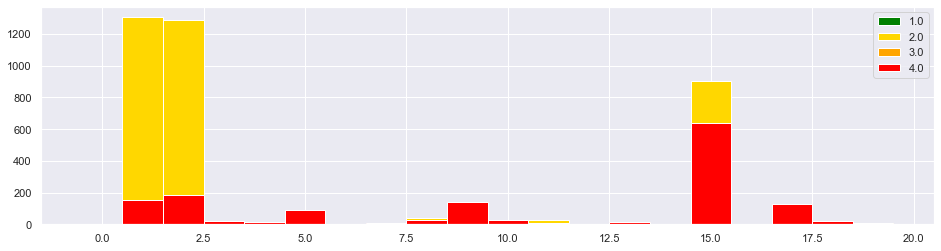

Pastries
1     0.000209
3     0.699206
4     0.011497
5     0.001881
6     0.073997
7     0.160535
8     0.006271
9     0.004181
10    0.001254
11    0.000209
12    0.000418
13    0.012333
14    0.001045
16    0.002926
17    0.018395
18    0.005017
19    0.000627
Name: cluster_2, dtype: float64


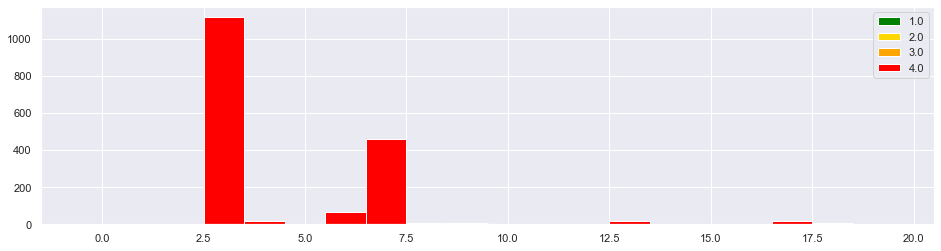

Biscuits and cakes
0     0.000018
1     0.000240
2     0.000055
3     0.468047
4     0.047796
5     0.001239
6     0.017739
7     0.015334
8     0.052735
9     0.009970
10    0.002664
11    0.002349
12    0.000777
13    0.054640
14    0.000425
15    0.003089
16    0.061854
17    0.195476
18    0.007954
19    0.057599
Name: cluster_2, dtype: float64


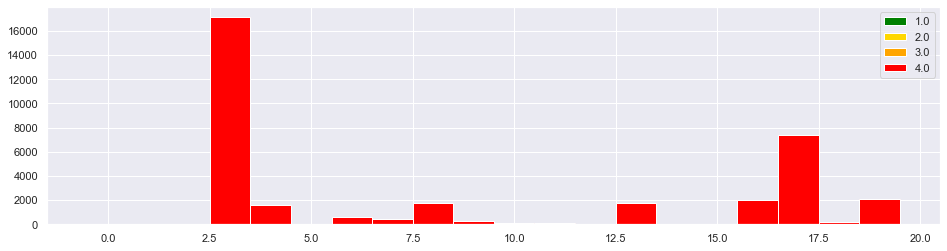

Sweets
0     0.000108
1     0.000173
2     0.000065
3     0.019529
4     0.009190
5     0.016495
6     0.001301
7     0.010534
8     0.166659
9     0.001669
10    0.000520
11    0.000390
12    0.000238
13    0.122421
14    0.000368
15    0.013829
16    0.031190
17    0.159420
18    0.016083
19    0.429816
Name: cluster_2, dtype: float64


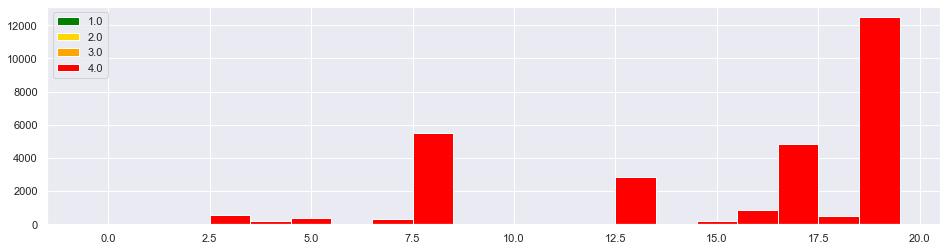

Chocolate products
1     0.002951
3     0.004947
4     0.020918
5     0.000521
6     0.000347
7     0.000521
8     0.867459
9     0.001562
10    0.016318
11    0.000260
12    0.000087
13    0.001042
14    0.000434
15    0.005555
16    0.000260
17    0.065185
18    0.002430
19    0.009201
Name: cluster_2, dtype: float64


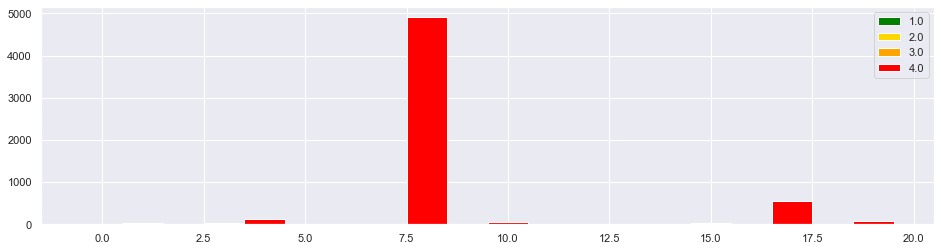

Appetizers
0     0.000106
1     0.000425
3     0.014147
4     0.677481
5     0.002659
6     0.102223
7     0.018934
8     0.005212
9     0.009999
10    0.005425
11    0.005106
12    0.004361
13    0.000745
14    0.000319
15    0.010424
16    0.112435
17    0.010318
18    0.018083
19    0.001596
Name: cluster_2, dtype: float64


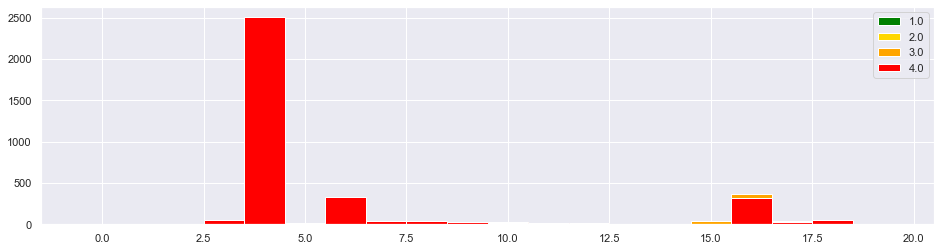

Nuts
1     0.001631
2     0.020555
3     0.003589
4     0.031485
5     0.001631
6     0.011582
7     0.003426
8     0.008320
9     0.010114
10    0.004731
11    0.000326
12    0.002610
13    0.001142
14    0.000489
15    0.860848
16    0.002773
17    0.024796
18    0.006852
19    0.003100
Name: cluster_2, dtype: float64


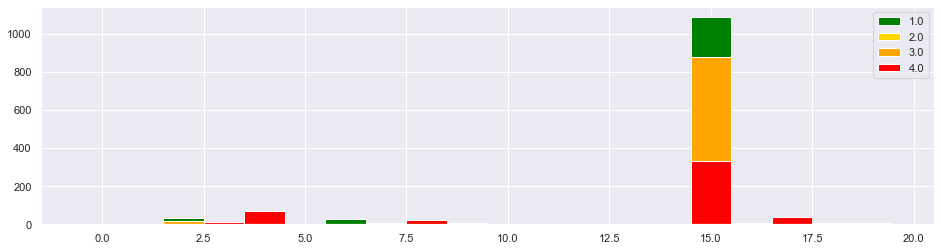

Salty and fatty products
0     0.000090
1     0.007459
2     0.015457
3     0.000629
4     0.010244
5     0.032620
6     0.016265
7     0.002067
8     0.000180
9     0.359543
10    0.082854
11    0.000899
12    0.043853
13    0.001528
14    0.003954
15    0.209202
16    0.001528
17    0.000270
18    0.211089
19    0.000270
Name: cluster_2, dtype: float64


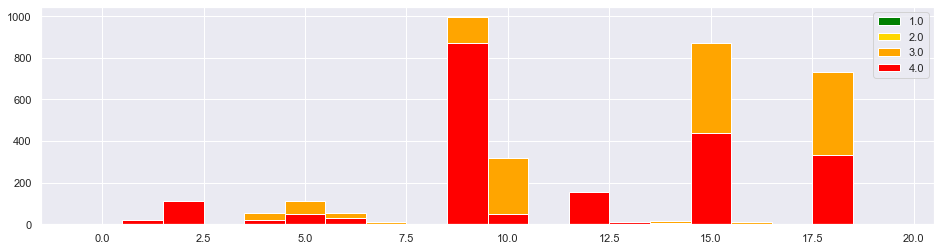

One-dish meals
0     0.000314
1     0.000029
2     0.000086
3     0.003314
4     0.022795
5     0.192984
6     0.148280
7     0.031650
8     0.000457
9     0.040305
10    0.004085
11    0.002342
12    0.051474
13    0.001600
14    0.009198
15    0.003799
16    0.070184
17    0.001914
18    0.414734
19    0.000457
Name: cluster_2, dtype: float64


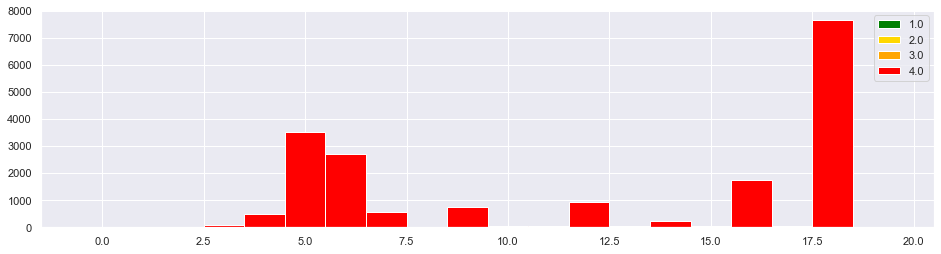

Sandwiches
3     0.002726
4     0.006965
5     0.002120
6     0.777105
7     0.031193
8     0.000303
9     0.054210
10    0.003331
11    0.000909
12    0.081769
13    0.000909
14    0.000909
15    0.000303
16    0.001514
18    0.035736
Name: cluster_2, dtype: float64


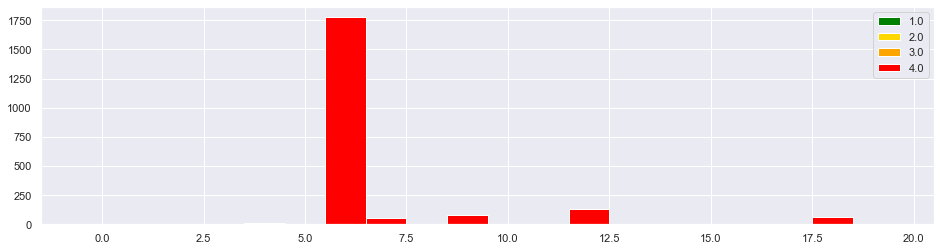

Pizza pies and quiches
3     0.046864
4     0.003416
5     0.001640
6     0.843148
7     0.020221
8     0.002596
9     0.034431
10    0.003416
11    0.000137
12    0.003006
13    0.011204
14    0.001230
15    0.000547
16    0.001640
17    0.012297
18    0.013526
19    0.000683
Name: cluster_2, dtype: float64


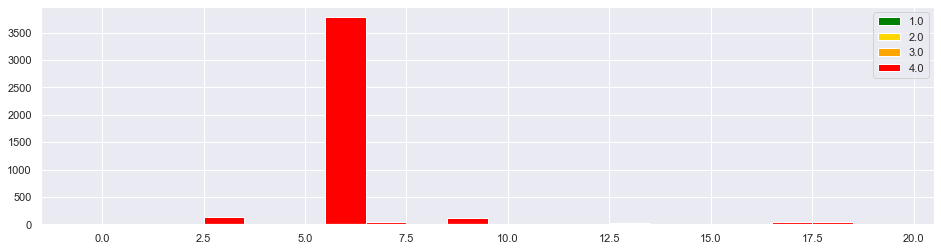

Sweetened beverages
0     0.000396
1     0.000079
2     0.000079
3     0.006177
4     0.000238
5     0.738676
6     0.001425
7     0.001109
8     0.002138
9     0.000475
11    0.008315
12    0.000950
13    0.012829
14    0.002138
16    0.004197
17    0.005306
18    0.046326
19    0.169148
Name: cluster_2, dtype: float64


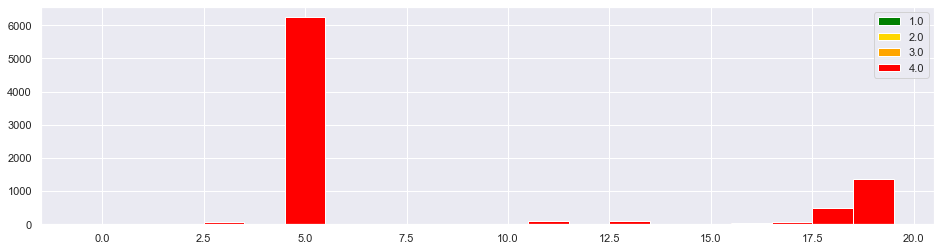

Unsweetened beverages
0     0.000440
1     0.000881
2     0.000147
3     0.003082
4     0.001468
5     0.881550
6     0.001908
7     0.005724
8     0.000440
9     0.001908
10    0.001027
11    0.037282
12    0.002348
13    0.006752
14    0.001615
15    0.001468
16    0.010568
17    0.001468
18    0.018494
19    0.021430
Name: cluster_2, dtype: float64


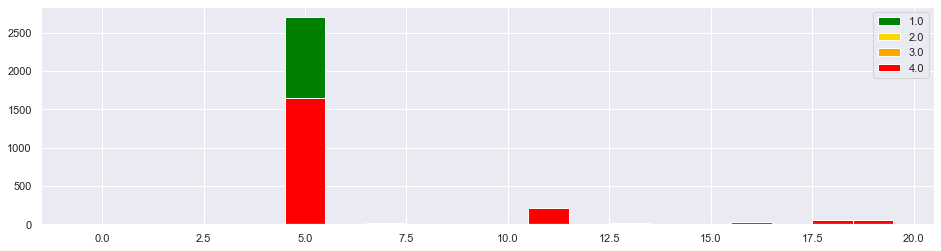

Artificially sweetened beverages
3     0.029276
5     0.779147
6     0.002311
7     0.009502
8     0.024910
9     0.000770
10    0.000257
11    0.052902
12    0.004109
13    0.004366
14    0.003595
16    0.015922
17    0.014638
18    0.033641
19    0.024653
Name: cluster_2, dtype: float64


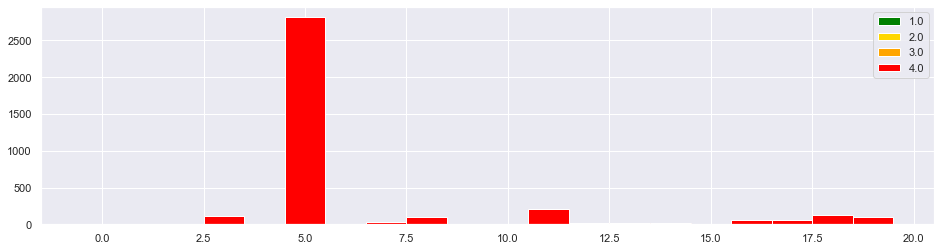

Plant-based milk substitutes
0     0.001440
1     0.003909
3     0.008436
4     0.019342
5     0.667078
6     0.000823
7     0.002263
8     0.015021
9     0.059465
10    0.000206
11    0.000823
13    0.094856
14    0.000617
15    0.001440
16    0.002469
17    0.027160
18    0.077366
19    0.017284
Name: cluster_2, dtype: float64


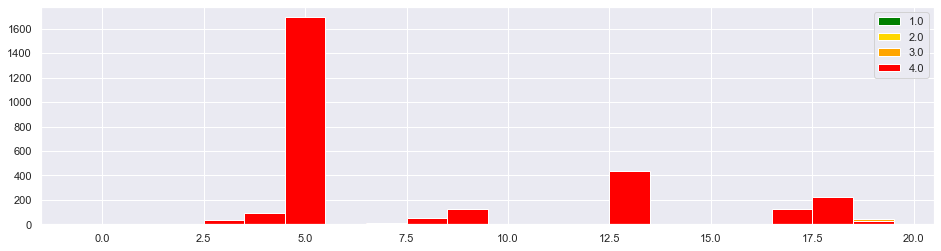

Fruit juices
3     0.000152
5     0.973433
6     0.000607
7     0.001215
9     0.000759
12    0.000152
13    0.005162
14    0.002429
16    0.001063
18    0.014119
19    0.000911
Name: cluster_2, dtype: float64


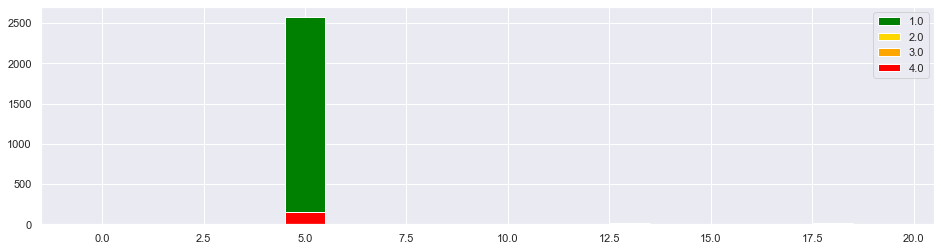

Fruit nectars
5     0.967603
13    0.003240
14    0.005400
18    0.022678
19    0.001080
Name: cluster_2, dtype: float64


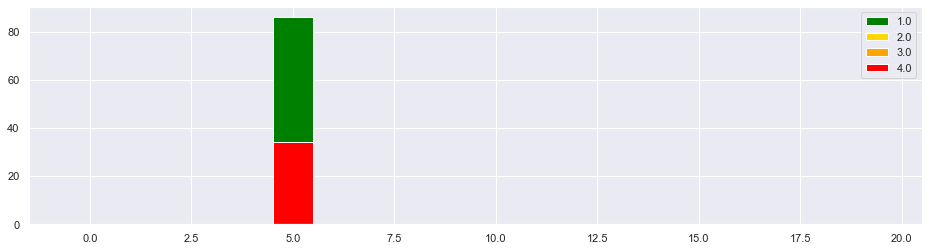

Waters and flavored waters
0     0.004072
5     0.974985
6     0.000582
7     0.001163
9     0.000582
10    0.000582
12    0.001745
13    0.000582
14    0.012216
18    0.003490
Name: cluster_2, dtype: float64


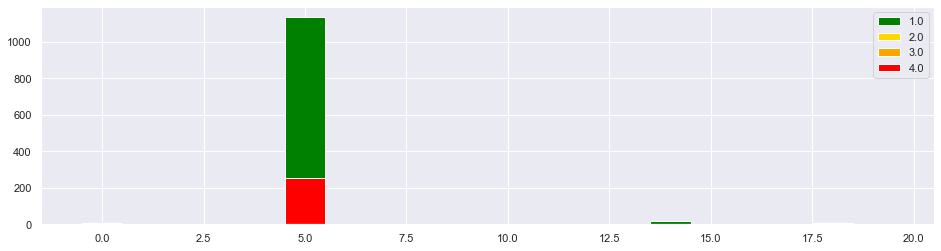

Teas and herbal teas and coffees
3     0.006928
5     0.912240
6     0.001155
7     0.002309
8     0.001155
9     0.001155
13    0.002309
16    0.004619
17    0.010393
18    0.038106
19    0.019630
Name: cluster_2, dtype: float64


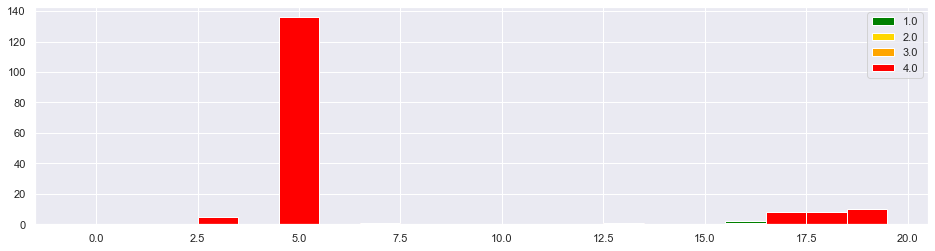

Alcoholic beverages
0     0.003956
2     0.000791
3     0.002373
4     0.001582
5     0.838608
6     0.004747
7     0.001582
8     0.002373
9     0.007911
10    0.001582
11    0.001582
12    0.002373
13    0.045095
14    0.004747
16    0.001582
17    0.001582
18    0.053797
19    0.023734
Name: cluster_2, dtype: float64


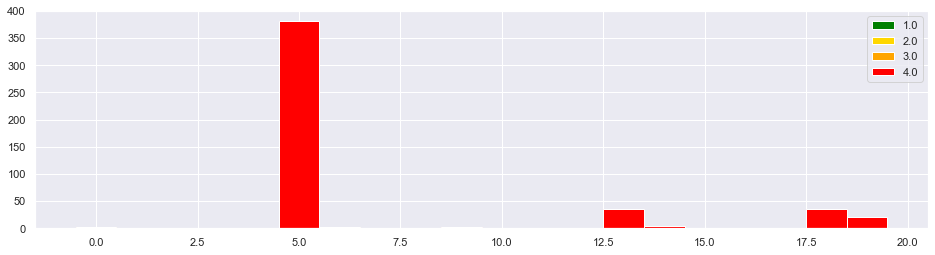

In [83]:
plot_hist_of_groups(X, 'cluster_2', 'pnns_groups_2', sub_group = 'nova_group', 
                    main_group_values = pnns_groups_2_values, sub_group_values = nova_group_values,
                    sub_group_colors = nova_group_colors,
                    printdetails = True, figsize = (16,4))

(array([ 2221., 12782., 14823.,  9348.,  4431.,  1878.,   830.,   266.,
           87.,    23.]),
 array([0.23941513, 0.60815838, 0.97690163, 1.34564488, 1.71438813,
        2.08313138, 2.45187463, 2.82061787, 3.18936112, 3.55810437,
        3.92684762]),
 <BarContainer object of 10 artists>)

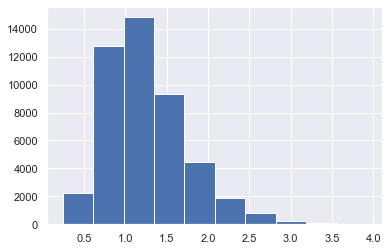

In [84]:
c = 4
kmeans.transform(X_scaled[X.cluster_2 == c])
plt.hist(kmeans.transform(X_scaled[X.cluster_2 == c])[:,c])

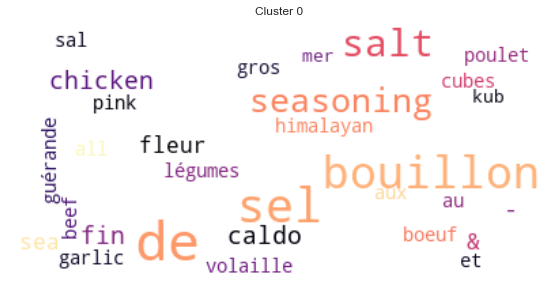

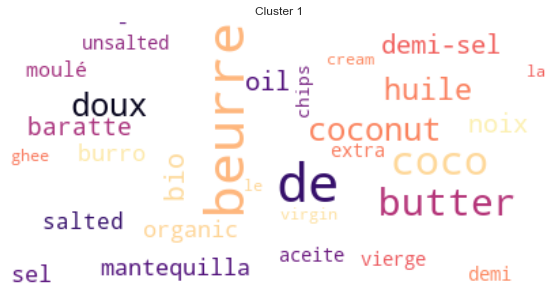

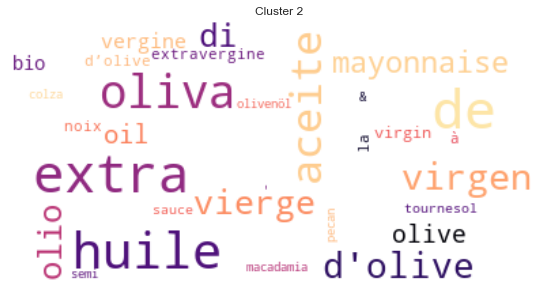

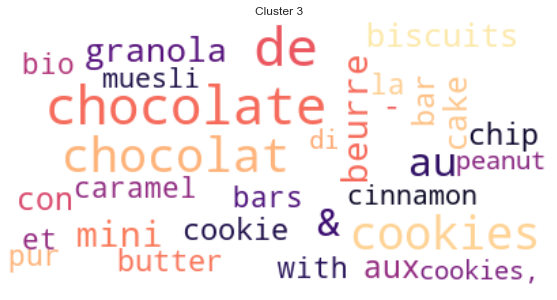

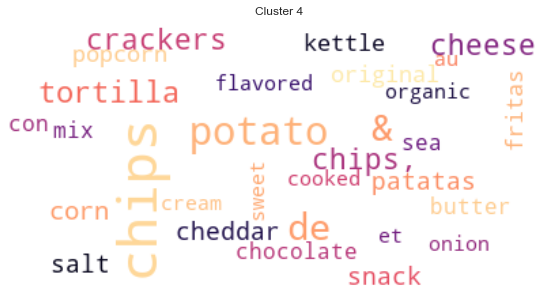

...

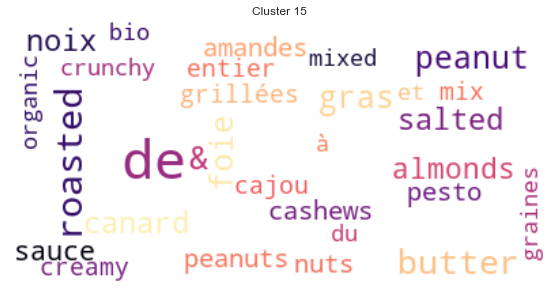

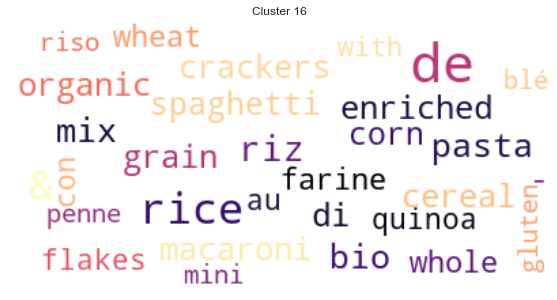

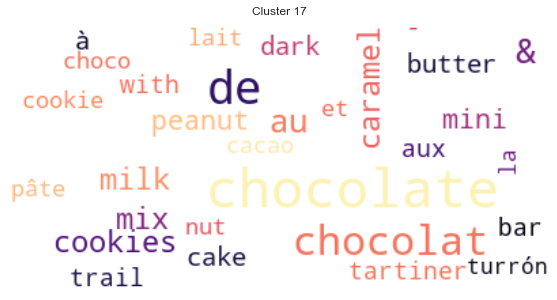

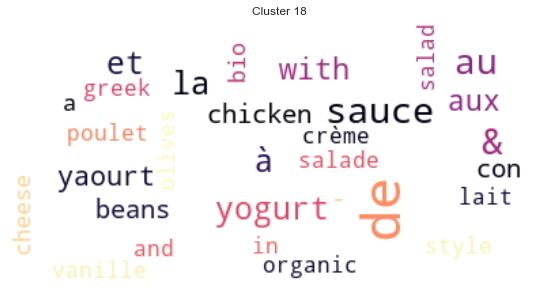

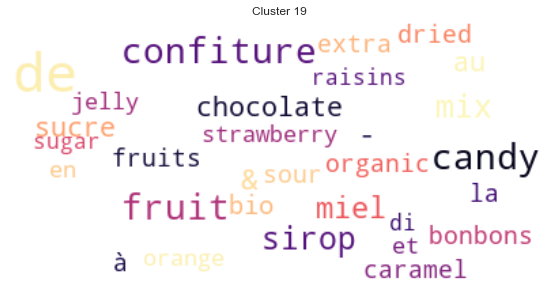

In [86]:
X["product"] = food_info_df.loc[X.index, "product_name"]
X["product"].fillna("unknown", inplace = True)
num_m = len(X["cluster_2"].unique()) // 2
#fig, ax = plt.subplots(num_m,2, figsize=(20,50))
for m in range(num_m):
    for n in range(2):
        cluster = m*2+ n
        title = "Cluster " + str(cluster) 
        #make_word_cloud(X, 'cluster_2',cluster, ax[m,n], title)
        fig, ax = plt.subplots(figsize=(10,5))
        make_word_cloud(X, 'cluster_2', cluster, ax, title)
        plt.show()


In [87]:
X.info()
if save_data :
    X.to_csv(os.getcwd() + '\\Data\\' + "X_data")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1233924 entries, 1 to 1907315
Data columns (total 18 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   fat_100g             1233924 non-null  float64
 1   saturated_fat_100g   1233924 non-null  float64
 2   otherfat_100g        1233924 non-null  float64
 3   carbohydrates_100g   1233924 non-null  float64
 4   sugars_100g          1233924 non-null  float64
 5   othercarbs_100g      1233924 non-null  float64
 6   proteins_100g        1233924 non-null  float64
 7   others_100g          1233924 non-null  float64
 8   salt_100g            1233924 non-null  float64
 9   energy_100g          1233924 non-null  float64
 10  energy_min_computed  1233924 non-null  float64
 11  energy_max_computed  1233924 non-null  float64
 12  pnns_groups_1        1233924 non-null  object 
 13  pnns_groups_2        1233924 non-null  object 
 14  nova_group           1233924 non-null  object 
 15

In [88]:
groupX = "cluster_2"
groupY = "pnns_groups_2"

cont = X[(X[groupX] != 'unknown') & (X[groupY] != 'unknown')][[groupX,groupY]].pivot_table(
        index=groupX,columns=groupY,aggfunc=len,margins=True,margins_name="Total")
#cont.drop('unknown', inplace = True)
#cont.drop('unknown', axis = 1, inplace = True)
cont = cont[pnns_groups_2_values + ["Total"]]
cont

pnns_groups_2,Bread,Cereals,Breakfast cereals,Potatoes,Legumes,Fruits,Dried fruits,Vegetables,Soups,Milk and yogurt,...,Sweetened beverages,Unsweetened beverages,Artificially sweetened beverages,Plant-based milk substitutes,Fruit juices,Fruit nectars,Waters and flavored waters,Teas and herbal teas and coffees,Alcoholic beverages,Total
cluster_2,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,1.0,NaN,NaN,1.0,NaN,8.0,2.0,1.0,...,5.0,3.0,NaN,7.0,NaN,NaN,7.0,NaN,5.0,77
1,NaN,4.0,2.0,NaN,3.0,30.0,193.0,4.0,NaN,4.0,...,1.0,6.0,NaN,19.0,NaN,NaN,NaN,NaN,NaN,3344
2,1.0,287.0,NaN,NaN,2.0,2.0,7.0,10.0,NaN,1.0,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,10698
3,261.0,2739.0,2496.0,2.0,7.0,9.0,160.0,38.0,6.0,18.0,...,78.0,21.0,114.0,41.0,1.0,NaN,NaN,6.0,3.0,36440
4,845.0,968.0,308.0,18.0,28.0,1.0,46.0,98.0,4.0,8.0,...,3.0,10.0,NaN,94.0,NaN,NaN,NaN,NaN,2.0,13630
5,76.0,366.0,10.0,307.0,470.0,7565.0,23.0,17422.0,2110.0,11943.0,...,9328.0,6006.0,3034.0,3242.0,6412.0,896.0,1676.0,790.0,1060.0,92309
6,1151.0,2021.0,64.0,816.0,177.0,18.0,9.0,341.0,6.0,42.0,...,18.0,13.0,9.0,4.0,4.0,NaN,1.0,1.0,6.0,25088
7,11857.0,2551.0,1240.0,63.0,1050.0,22.0,80.0,159.0,23.0,17.0,...,14.0,39.0,37.0,11.0,8.0,NaN,2.0,2.0,2.0,21102
8,3.0,48.0,8.0,1.0,7.0,2.0,104.0,108.0,NaN,35.0,...,27.0,3.0,97.0,73.0,NaN,NaN,NaN,1.0,3.0,21419


Measure: 2919657.8500268813


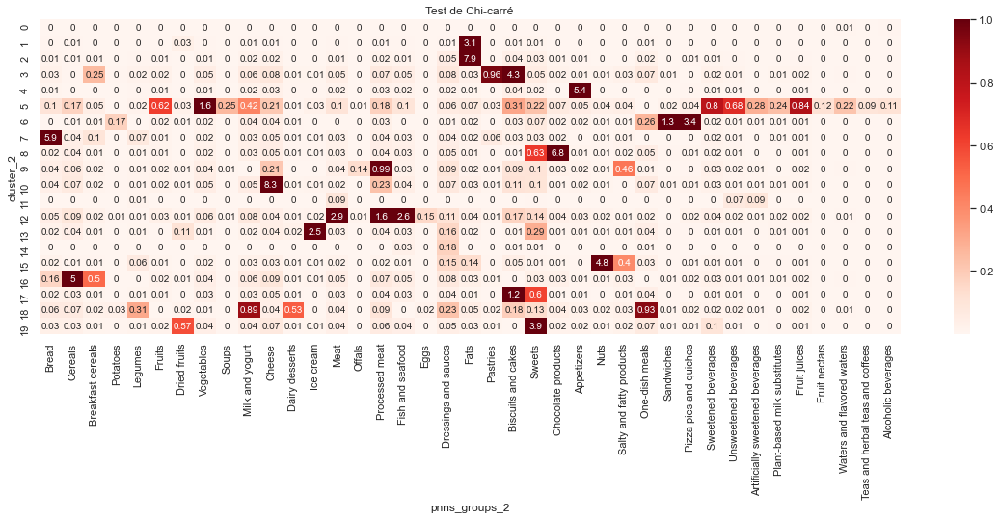

In [89]:
tx = pd.DataFrame(cont['Total'])
ty = pd.DataFrame(cont.T['Total'])

tx.columns = ["foo"]
ty.columns = ["foo"]

n = tx.iloc[-1]["foo"]
indep = tx.dot(ty.T) / n

c = cont.fillna(0) # Null values are replaced by 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
print("Measure:", xi_n)
fig, ax = plt.subplots(figsize = (20, 6))
sns.heatmap((100*measure/xi_n).iloc[:-1,:-1], annot=round((100*measure/xi_n).iloc[:-1,:-1],2), cmap="Reds", ax = ax, vmax = 1)
ax.set_title("Test de Chi-carré")
plt.show()

#### Just playing around

In [90]:
X.columns

Index(['fat_100g', 'saturated_fat_100g', 'otherfat_100g', 'carbohydrates_100g',
       'sugars_100g', 'othercarbs_100g', 'proteins_100g', 'others_100g',
       'salt_100g', 'energy_100g', 'energy_min_computed',
       'energy_max_computed', 'pnns_groups_1', 'pnns_groups_2', 'nova_group',
       'cluster_1', 'product', 'cluster_2'],
      dtype='object')

Cluster 0


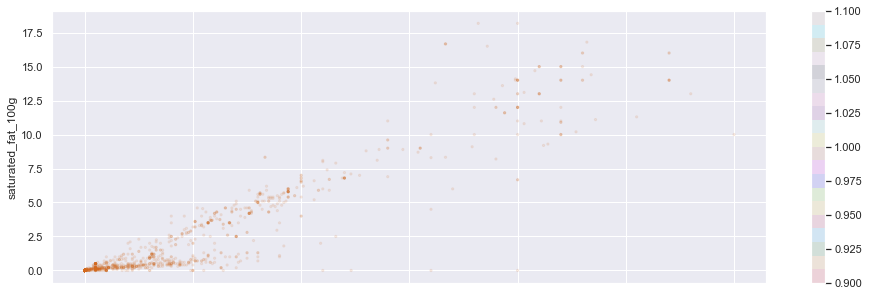

Cluster 1


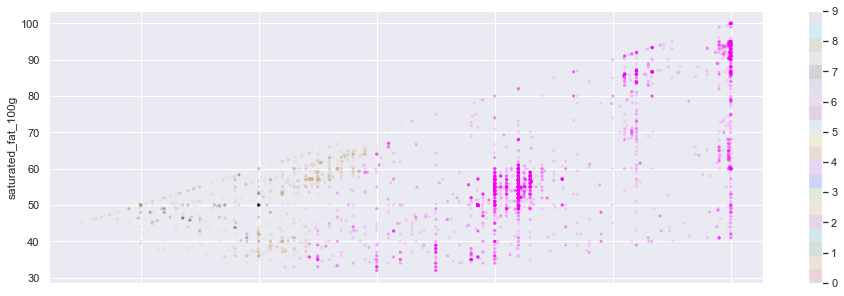

Cluster 2


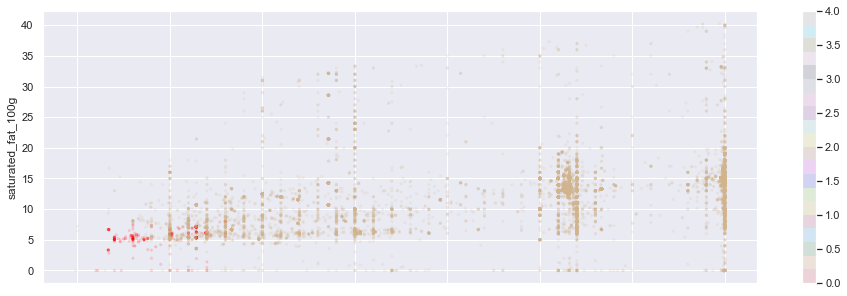

Cluster 3


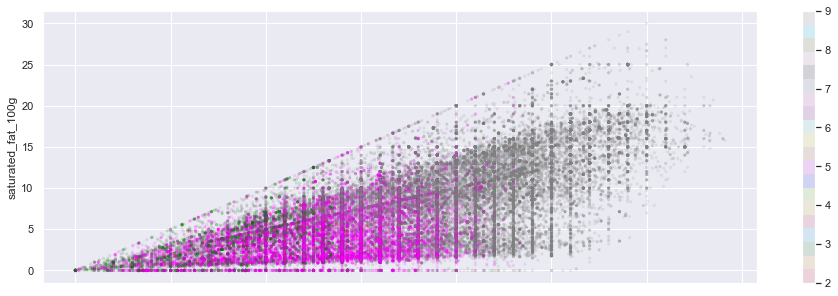

Cluster 4


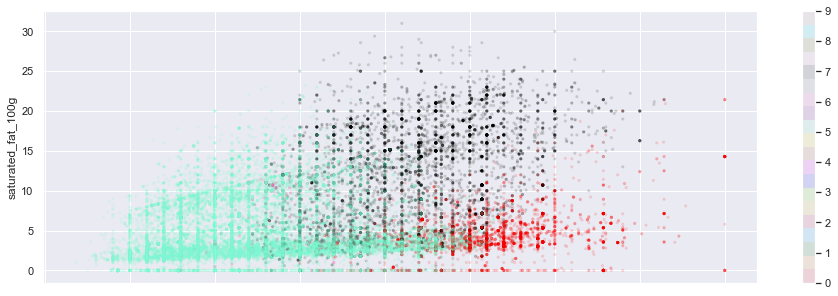

Cluster 5


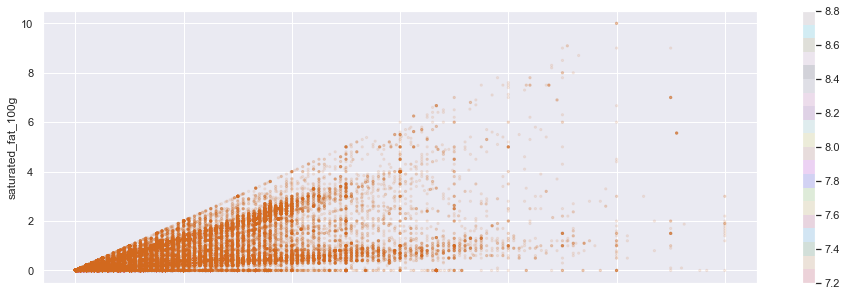

Cluster 6


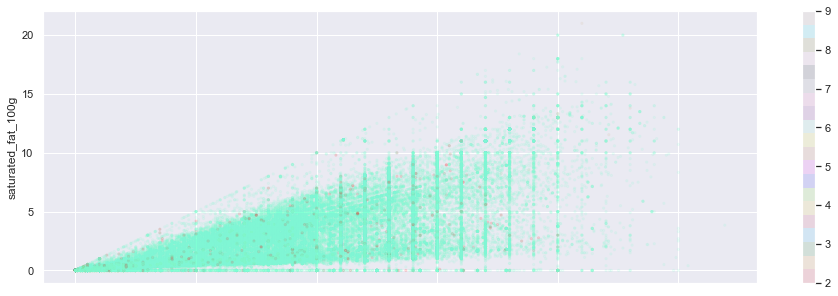

Cluster 7


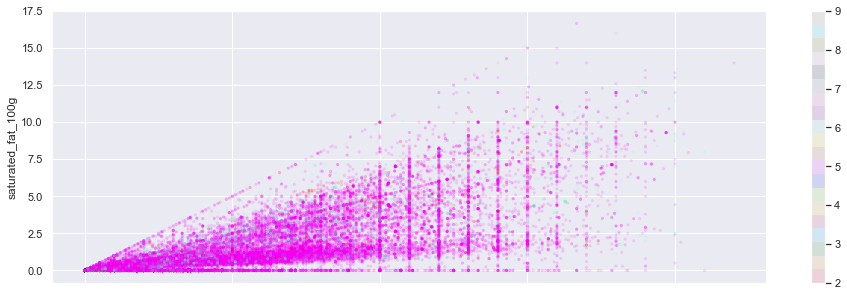

Cluster 8


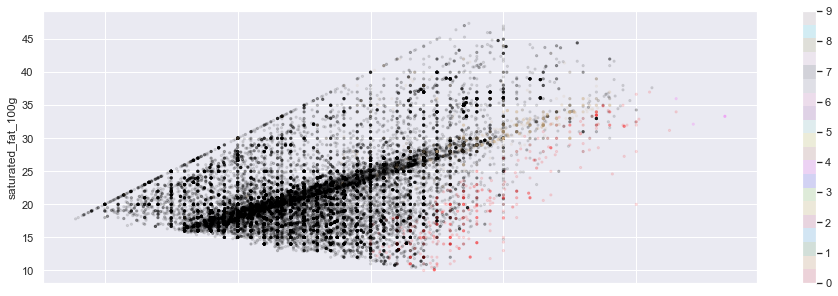

Cluster 9


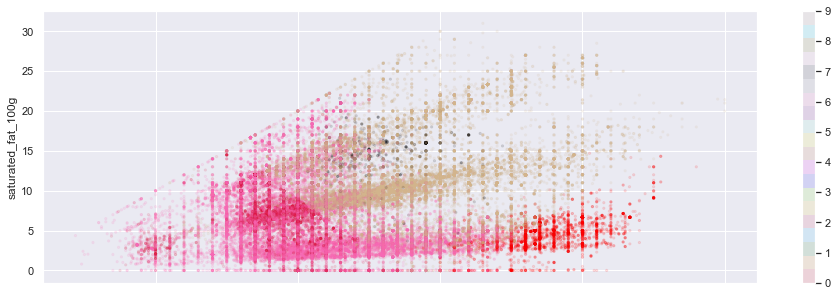

Cluster 10


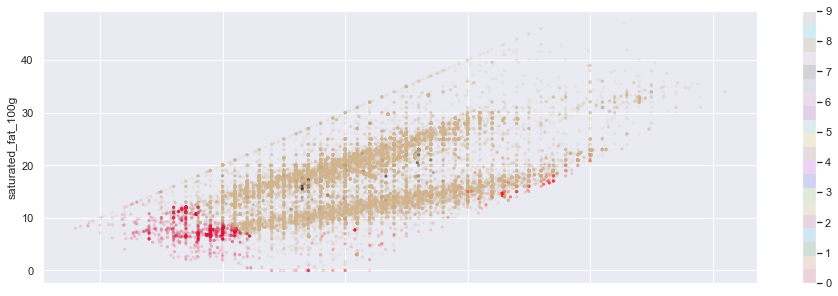

Cluster 11


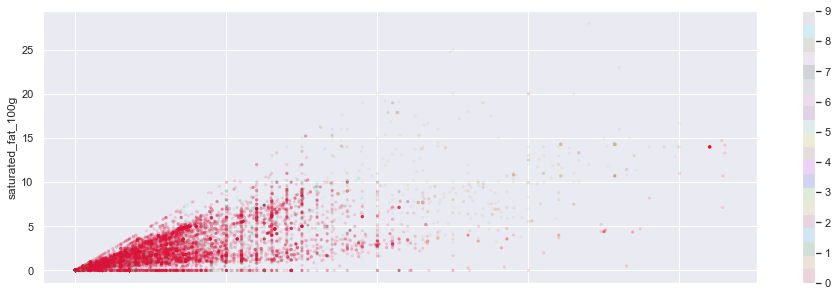

Cluster 12


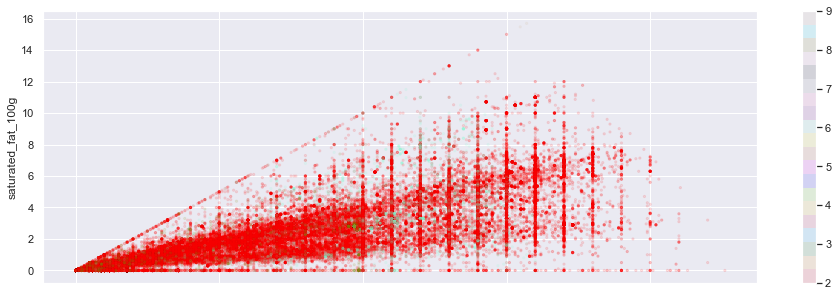

Cluster 13


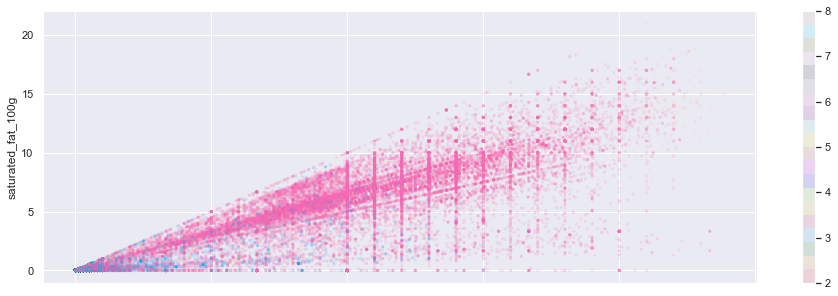

Cluster 14


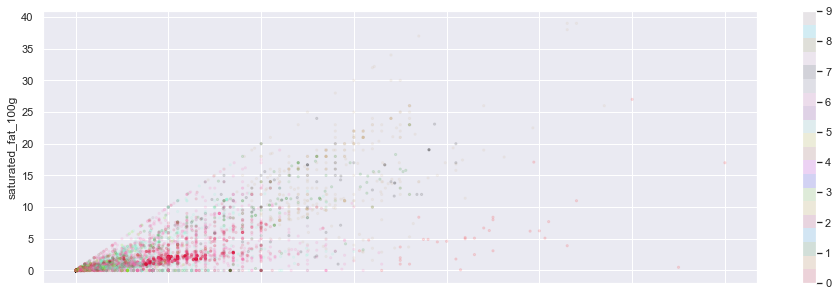

Cluster 15


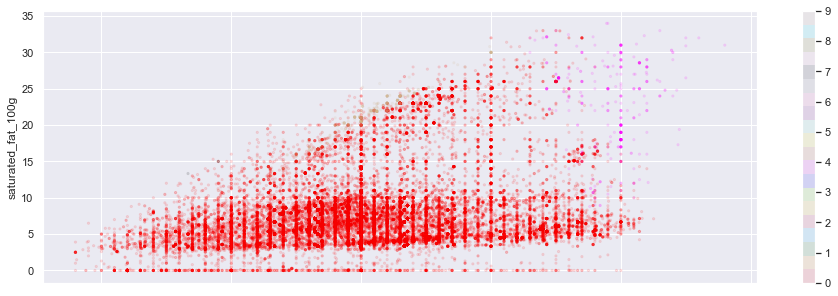

Cluster 16


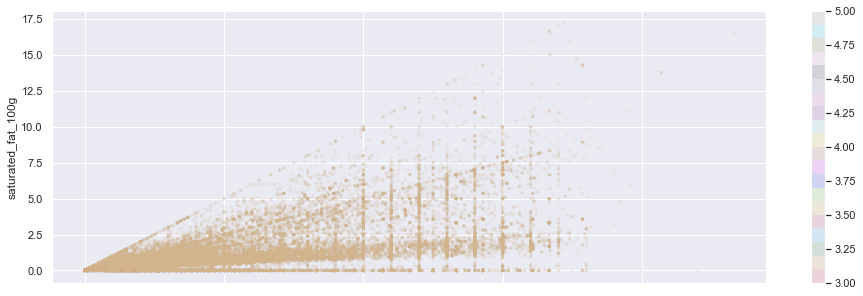

Cluster 17


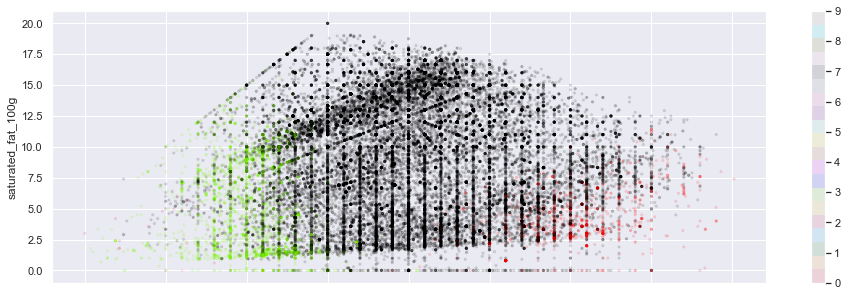

Cluster 18


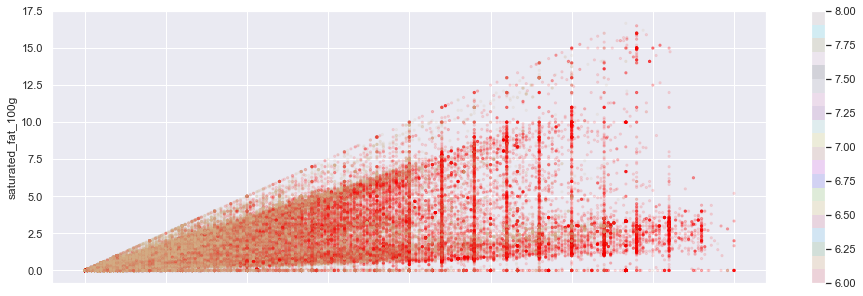

Cluster 19


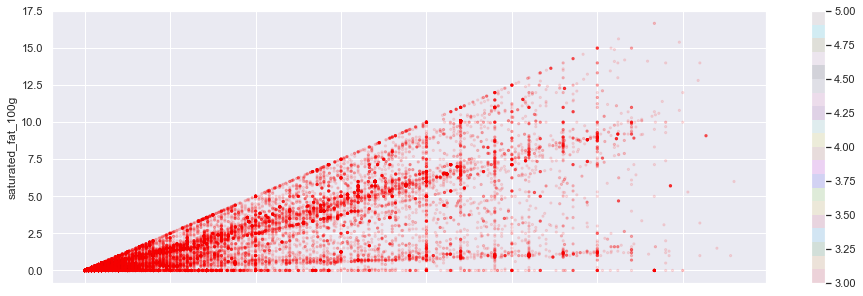

In [91]:
from matplotlib.colors import ListedColormap as ListedColormap

my_colors = ListedColormap(["red", "orange", "green", "deepskyblue", "crimson",
                            "gold", "lawngreen", "blue", "magenta", "chocolate",
                            "yellow", "aquamarine", "purple", "hotpink", "grey",
                            "black", "pink","olive","cyan", "tan" ])

#scatter plot
for i in range(20):
    print("Cluster "+str(i))
    X[X.cluster_2 == i].plot.scatter('fat_100g', 'saturated_fat_100g', 
                c=X[X.cluster_2 == i].cluster_1, cmap=my_colors, marker='.', figsize=(16,5), alpha = 0.1)
    plt.show()

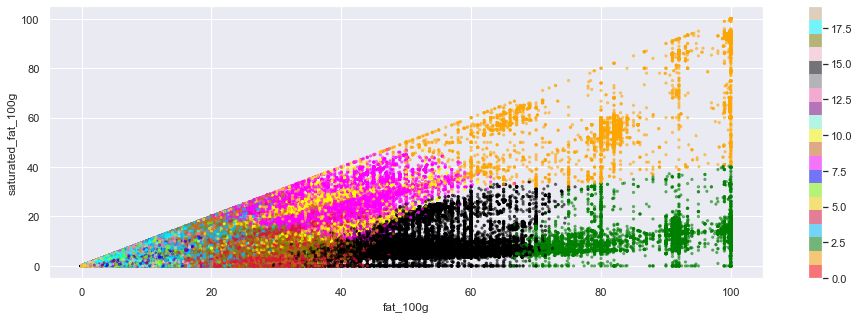

In [92]:
fig, ax = plt.subplots()
X.plot.scatter('fat_100g', 'saturated_fat_100g', 
                c=X.cluster_2, cmap=my_colors, marker='.', figsize=(16,5), ax= ax, alpha = 0.5)
ax.set_xlabel('fat_100g')
plt.show()

In [ ]:
fig, ax = plt.subplots()
X.plot.scatter('carbohydrates_100g', 'sugars_100g', 
                c=X.cluster_2, cmap=my_colors, marker='.', figsize=(16,5), ax= ax, alpha = 0.5)
ax.set_xlabel('fat_100g')
plt.show()

id_index
1367884    Camponesas
Name: product_name, dtype: object


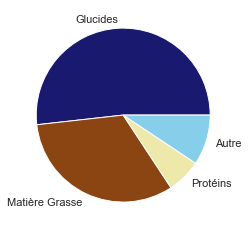

In [93]:
#fooditem = nutritional_values_df.sample(1).index.values
fooditem = [285653] #Almonds
fooditem = [1367884] #Camponesas = Champions
#fooditem = nutritional_values_df.sample(1).index.values
product = food_info_df.loc[fooditem].product_name
slices = (list(nutritional_values_df.loc[fooditem].carbohydrates_100g) + 
          list(nutritional_values_df.loc[fooditem].fat_100g) +
          list(nutritional_values_df.loc[fooditem].proteins_100g) + 
          list(nutritional_values_df.loc[fooditem].others_100g))
labels = ['Glucides','Matière Grasse','Protéins', 'Autre']
print(product)
plt.pie(slices, labels = labels, colors = ['midnightblue', 'saddlebrown', 'palegoldenrod', 'skyblue'])
if save_figures:
    plt.savefig(os.getcwd() + '\\Figures\\' + name +'_PieChart_CompositionExample', dpi = 200)

unknown


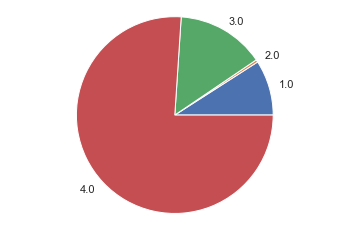

Dressings and sauces


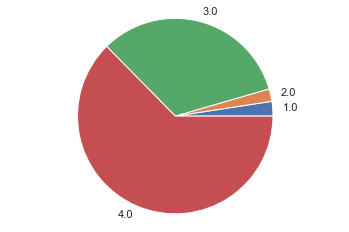

One-dish meals


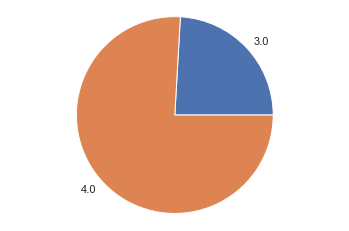

Biscuits and cakes


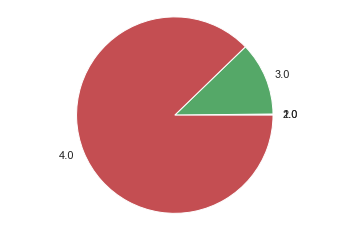

Fruits


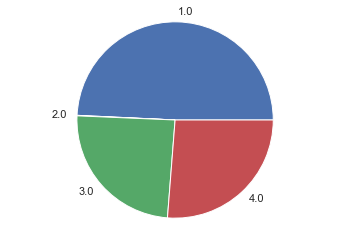

Meat


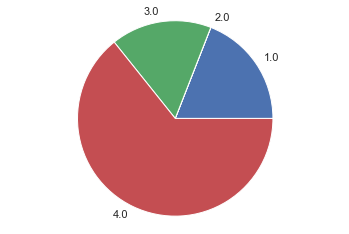

Sweetened beverages


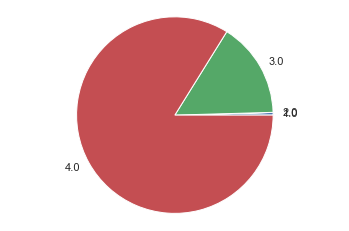

Cheese


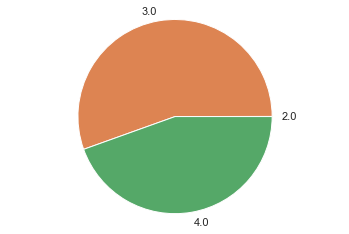

Bread


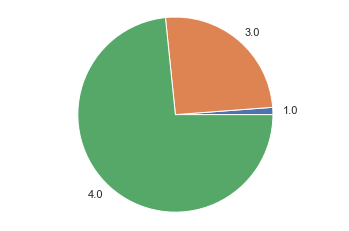

Fish and seafood


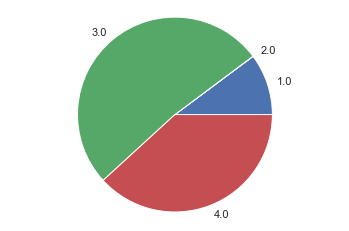

Sweets


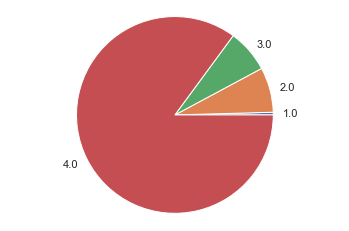

Salty and fatty products


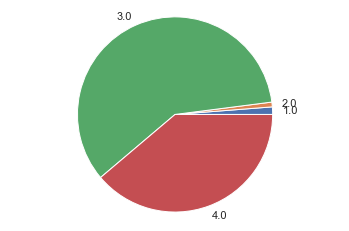

Fruit juices


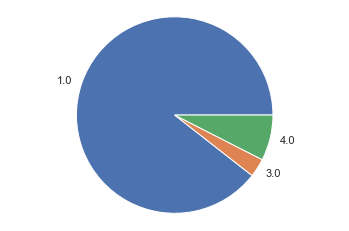

Dried fruits


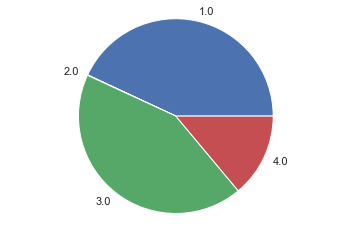

Vegetables


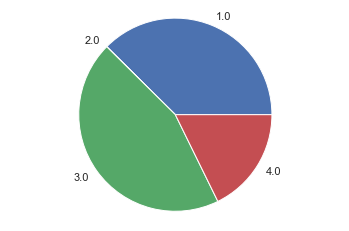

Fats


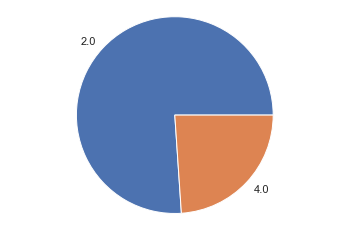

Dairy desserts


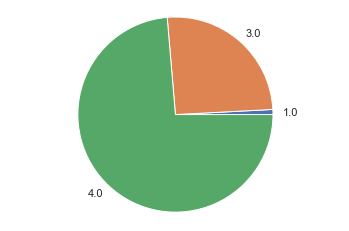

Milk and yogurt


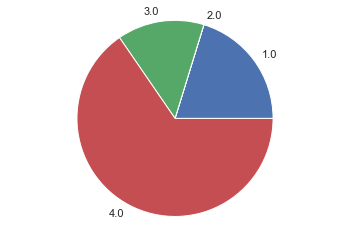

Pastries


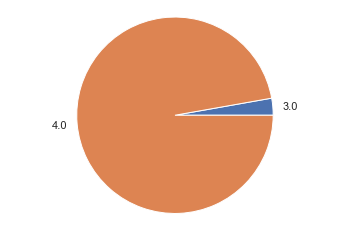

Pizza pies and quiches


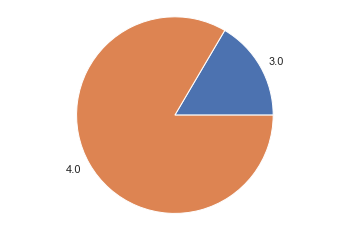

Legumes


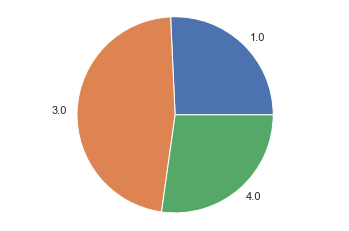

Unsweetened beverages


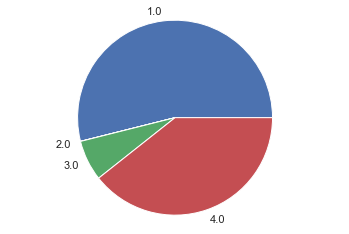

Nuts


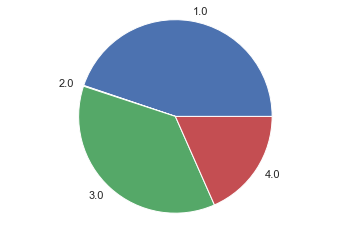

Cereals


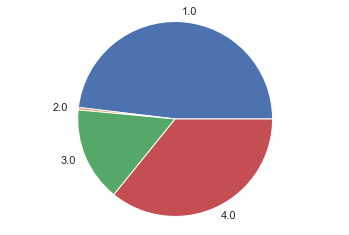

Alcoholic beverages


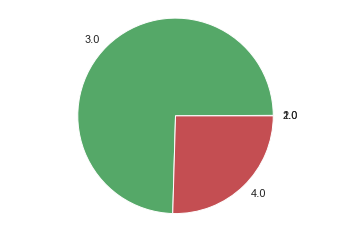

Breakfast cereals


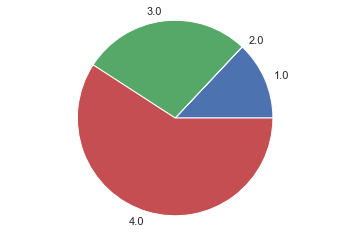

Appetizers


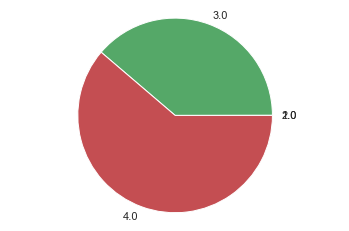

Processed meat


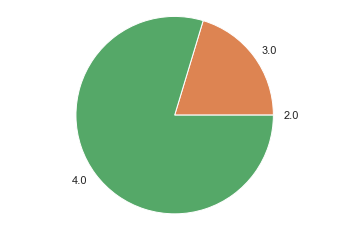

Chocolate products


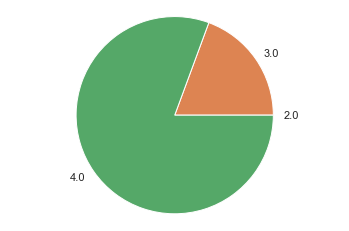

Eggs


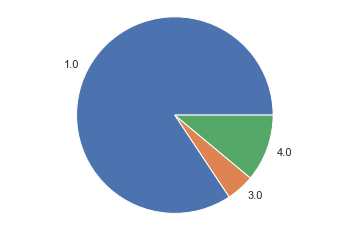

Plant-based milk substitutes


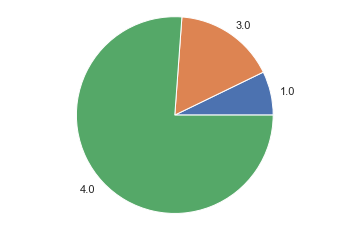

Sandwiches


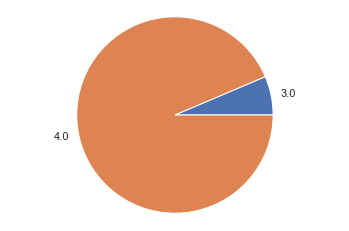

Ice cream


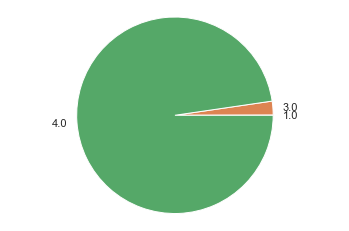

Soups


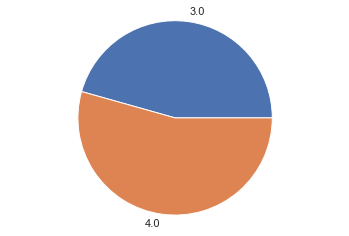

Teas and herbal teas and coffees


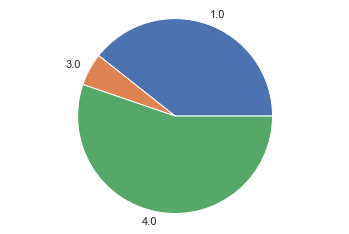

Potatoes


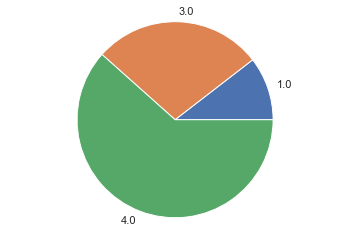

Artificially sweetened beverages


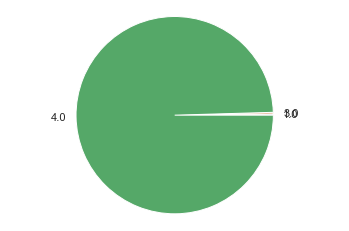

Waters and flavored waters


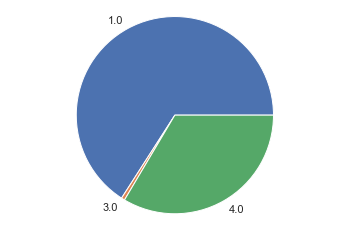

Offals


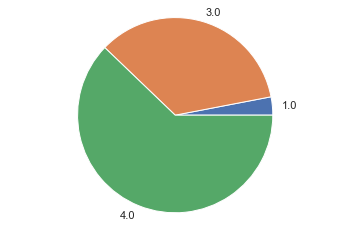

Fruit nectars


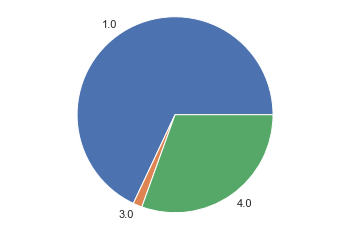

In [94]:
labels = ['1.0','2.0','3.0','4.0']
for p2 in food_groups_df.pnns_groups_2.unique() :
    print(p2)
    plot_pie_value_counts(food_groups_df[food_groups_df.pnns_groups_2 == p2].nova_group, labels = labels)

In [95]:
sns.pairplot(X[X.pnns_groups_1 != 'unknown'], hue="pnns_groups_1", plot_kws = {'alpha' : 0.1})

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x00000222781AA8B0> (for post_execute):


KeyboardInterrupt: 